<h1 style="font-size: 38px; text-align: center; color: blue">The implementation of deep learning to develop an adequate tool for identifying the bumblebee species in Ireland</h1>

<br> </br>

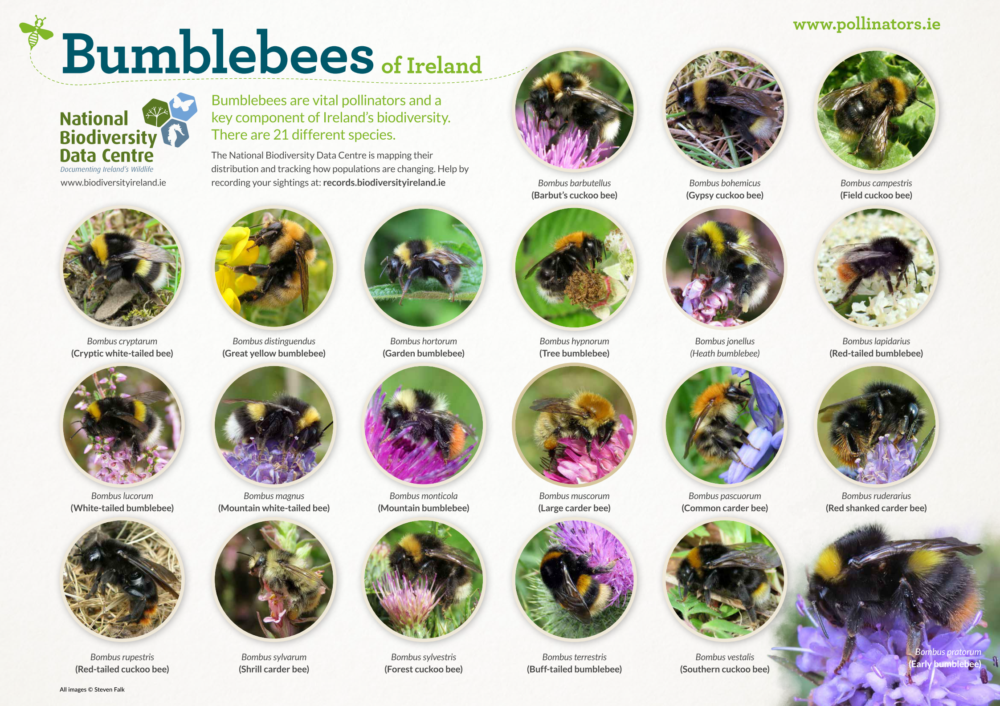

<br> </br>

In [31]:
# Import libraries
import os
import shutil
import random
import xml.etree.ElementTree as ET
import cv2

import warnings
warnings.filterwarnings("ignore")

# Import libraries
import pathlib
import itertools
import glob
import numpy as np

import PIL
from PIL import Image

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

In [32]:
# Set data directory for training, validating and testing
training_data_dir = pathlib.Path('/home/hduser/Desktop/final dataset testing/machine learning/train/')
validate_data_dir = pathlib.Path('/home/hduser/Desktop/final dataset testing/machine learning/validate/')

print(training_data_dir)
print(validate_data_dir)

/home/hduser/Desktop/final dataset testing/machine learning/train
/home/hduser/Desktop/final dataset testing/machine learning/validate


<br> </br>
- **Check the image in the train folder**

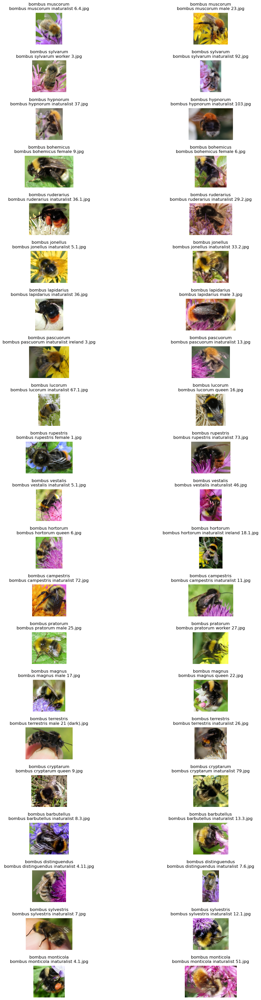

In [33]:
# Get the list of subdirectories (species)
species_list = [subdir.name for subdir in training_data_dir.glob('*')]

# Create a subplot grid
fig, axes = plt.subplots(21, 2, figsize=(15, 50))

# Adjust layout to provide space for titles
plt.subplots_adjust(hspace=0.5)

# Loop through each species
for i, species in enumerate(species_list):
    # Get two images from each species
    species_images = list(training_data_dir.glob(f'{species}/*'))[:2]

    # Loop through each image for the species
    for j, image_path in enumerate(species_images):
        image = Image.open(str(image_path))

        # Extract filename from path
        filename = os.path.basename(image_path)

        # Display the image on the subplot
        axes[i, j].imshow(image)
        axes[i, j].set_title(f'{species}\n{filename}', y=1.02)  # Adjust y position for title
        axes[i, j].axis('off')

plt.show()

<br> </br>

<h1 style="font-size: 28px; text-align: center; color: green"> 3. Deep Learning Models Training using Pytorch </h1>

<br> </br>

In [34]:
# Import libraries
import pandas as pd

import time
import copy

from __future__ import print_function 
from __future__ import division
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler

import torchvision
from torchvision import datasets, models, transforms
from torch.utils import data
from torch.utils.data import DataLoader, Dataset, ConcatDataset
from torchvision.transforms import v2 as T
import torchvision.transforms.functional as TF

from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

In [35]:
print("PyTorch Version: ",torch.__version__)
print("Torchvision Version: ",torchvision.__version__)

PyTorch Version:  2.1.0
Torchvision Version:  0.16.0


<br> </br>
- <h1 style="font-size: 16px"> Create functions for building and training pre-trained models in Pytorch. </h1>
<br> </br>

In [36]:
def set_parameter_requires_grad(model, feature_extracting):
    if feature_extracting:
        for param in model.parameters():
            param.requires_grad = False

In [37]:
def initialize_model(model_name, num_classes, feature_extract):
    # Initialize these variables which will be set in this if statement. Each of these
    #   variables is model specific.
    model_ft = None

    if model_name == "squeezenet":
        """ Squeezenet
        """
        model_ft = models.squeezenet1_1(weights='DEFAULT')
        set_parameter_requires_grad(model_ft, feature_extract)
        model_ft.classifier[0] = nn.Dropout(p=0.4, inplace=False)
        model_ft.classifier[1] = nn.Conv2d(512, num_classes, kernel_size=(1,1), stride=(1,1))
        model_ft.num_classes = num_classes
    
    elif model_name == "densenet":
        """ Densenet121
        """
        model_ft = models.densenet121(weights='DEFAULT')
        set_parameter_requires_grad(model_ft, feature_extract)
        num_ftrs = model_ft.classifier.in_features
        #model_ft.classifier = nn.Linear(num_ftrs, num_classes)
        model_ft.avgpool = nn.AdaptiveAvgPool2d(output_size=(1, 1))
        model_ft.classifier = nn.Sequential(
            nn.Dropout(p=0.4, inplace=False),
            nn.Linear(num_ftrs, num_classes)
        )

    elif model_name == "mnasnet":
        """ MNASNET1_0
        """
        model_ft = models.mnasnet1_0(weights='DEFAULT')
        set_parameter_requires_grad(model_ft, feature_extract)
        num_ftrs = model_ft.classifier[1].in_features
        model_ft.avgpool = nn.AdaptiveAvgPool2d(output_size=(1, 1))
        model_ft.classifier[0] = nn.Dropout(p=0.4, inplace=False)
        model_ft.classifier[1] = nn.Linear(num_ftrs, num_classes)
        model_ft.num_classes = num_classes

    elif model_name == "shufflenet":
        """ ShuffleNetV2
        """
        model_ft = models.shufflenet_v2_x2_0(weights='DEFAULT')
        set_parameter_requires_grad(model_ft, feature_extract)
        num_ftrs = model_ft.fc.in_features
        #model_ft.fc = nn.Linear(num_ftrs, num_classes)
        model_ft.avgpool = nn.AdaptiveAvgPool2d(output_size=(1, 1))
        model_ft.classifier = nn.Sequential(
            nn.Dropout(p=0.4, inplace=False),
            nn.Linear(num_ftrs, num_classes)
        )

    elif model_name == "googlenet":
        """ GoogleNet
        """
        model_ft = models.googlenet(weights='DEFAULT')
        set_parameter_requires_grad(model_ft, feature_extract)
        num_ftrs = model_ft.fc.in_features
        model_ft.dropout = nn.Dropout(p=0.4, inplace=False)
        model_ft.fc = nn.Linear(num_ftrs, num_classes)

    else:
        print("Invalid model name, exiting...")
        exit()
    
    return model_ft

In [38]:
def train_model(model, dataloaders, criterion, optimizer, num_epochs=25, is_squeezenet=False):
    since = time.time()

    history = []

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    model = model.to(device)

    # Define StepLR scheduler
    step_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=step_size, 
                                            gamma=gamma, verbose=True)

    # Define ReduceLROnPlateau scheduler
    reduce_lr_scheduler = lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', 
                                                         factor=0.9, patience=5, 
                                                         verbose=True)

    for epoch in range(num_epochs):
        epoch_start = time.time()
        print("Epoch: {:03d}/{:03d}".format(epoch + 1, num_epochs))

        for phase in ['train', 'validate']:
            if phase == 'train':
                step_lr_scheduler.step()  # StepLR scheduler step
                model.train()
            else:
                model.eval()

            running_loss = 0.0
            running_corrects = 0

            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    if is_squeezenet and phase == 'train':
                        outputs = model(inputs)
                        loss = criterion(outputs, labels)
                    else:
                        outputs = model(inputs)
                        loss = criterion(outputs, labels)

                        if not is_squeezenet and phase == 'train':
                            outputs, aux_outputs = outputs

                    _, preds = torch.max(outputs, 1)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)

            print("{} Loss: {:.4f} Accuracy: {:.4f}%".format(phase.capitalize(), epoch_loss, epoch_acc * 100))

            # Save information in history
            if phase == 'train':
                train_loss = epoch_loss
                train_accuracy = epoch_acc.item()
            elif phase == 'validate':
                validate_loss = epoch_loss
                validate_accuracy = epoch_acc.item()

            if phase == 'validate':
                reduce_lr_scheduler.step(epoch_acc)  # ReduceLROnPlateau scheduler step
                if epoch_acc > best_acc:
                    best_acc = epoch_acc
                    best_model_wts = copy.deepcopy(model.state_dict())

        history.append([train_loss, train_accuracy, validate_loss, validate_accuracy])

        epoch_end = time.time()
        print("Epoch duration: {:.4f}s".format(epoch_end - epoch_start))
        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))
    print('Best Validation Accuracy: {:.4f}%'.format(best_acc * 100))

    model.load_state_dict(best_model_wts)

    return model, history

<br> </br>
- ignore

In [39]:
# def train_model_with_early_stopping(model, dataloaders, criterion, optimizer, scheduler, num_epochs=25, is_squeezenet=False, patience=5):
#     since = time.time()

#     history = []

#     best_model_wts = copy.deepcopy(model.state_dict())
#     best_acc = 0.0

#     device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
#     model = model.to(device)

#     counter = 0  # Counter for early stopping
#     early_stop = False

#     for epoch in range(num_epochs):
#         epoch_start = time.time()
#         print("Epoch: {:03d}/{:03d}".format(epoch + 1, num_epochs))

#         for phase in ['train', 'validate']:
#             if phase == 'train':
#                 scheduler.step()
#                 model.train()
#             else:
#                 model.eval()

#             running_loss = 0.0
#             running_corrects = 0

#             for inputs, labels in dataloaders[phase]:
#                 inputs = inputs.to(device)
#                 labels = labels.to(device)

#                 optimizer.zero_grad()

#                 with torch.set_grad_enabled(phase == 'train'):
#                     if is_squeezenet and phase == 'train':
#                         outputs = model(inputs)
#                         loss = criterion(outputs, labels)
#                     else:
#                         outputs = model(inputs)
#                         loss = criterion(outputs, labels)

#                         if not is_squeezenet and phase == 'train':
#                             outputs, aux_outputs = outputs

#                     _, preds = torch.max(outputs, 1)

#                     if phase == 'train':
#                         loss.backward()
#                         optimizer.step()

#                 running_loss += loss.item() * inputs.size(0)
#                 running_corrects += torch.sum(preds == labels.data)

#             epoch_loss = running_loss / len(dataloaders[phase].dataset)
#             epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)

#             print("{} Loss: {:.4f} Accuracy: {:.4f}%".format(phase.capitalize(), epoch_loss, epoch_acc * 100))

#             # Save information in history
#             if phase == 'train':
#                 train_loss = epoch_loss
#                 train_accuracy = epoch_acc.item()
#             elif phase == 'validate':
#                 validate_loss = epoch_loss
#                 validate_accuracy = epoch_acc.item()

#                 # Early stopping check
#                 if validate_accuracy > best_acc:
#                     best_acc = validate_accuracy
#                     best_model_wts = copy.deepcopy(model.state_dict())
#                     counter = 0  # Reset counter if there's an improvement
#                 else:
#                     counter += 1
#                     if counter >= patience:
#                         early_stop = True
#                         print("Early stopping triggered.")
#                         break

#         history.append([train_loss, train_accuracy, validate_loss, validate_accuracy])

#         epoch_end = time.time()
#         print("Epoch duration: {:.4f}s".format(epoch_end - epoch_start))
#         print()

#         if early_stop:
#             break  # Break out of the main loop if early stopping is triggered

#     time_elapsed = time.time() - since
#     print('Training complete in {:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))
#     print('Best Validation Accuracy: {:.4f}%'.format(best_acc * 100))

#     model.load_state_dict(best_model_wts)

#     return model, history

<br> </br>
- <h1 style="font-size: 16px"> Create functions for plotting results using Pytorch. </h1>
<br> </br>

In [55]:
def plot_accuracy_pytorch(epochs, history, model_name):
    history = np.array(history)
    
    plt.figure(figsize=(8, 8))
    epochs_range = range(1, epochs + 1)

    plt.plot(epochs_range, history[:, 1], label="Training Accuracy", color='green')
    plt.plot(epochs_range, history[:, 3], label="Validation Accuracy", color='blue', linestyle='--')
    
    plt.ylim(0, 1)
    plt.grid(True, alpha=0.7)
    
    plt.title(f'Train and Validation Accuracy of {model_name} Model')
    plt.ylabel('Accuracy')
    plt.xlabel('Epochs')
    plt.legend(['train', 'validation'])
    
    plt.show()

In [56]:
def plot_loss_pytorch(epochs, history, model_name):
    history = np.array(history)
    
    plt.figure(figsize=(8, 8))
    epochs_range = range(1, epochs + 1)

    plt.plot(epochs_range, history[:, 0], label="Training Loss", color='green')
    plt.plot(epochs_range, history[:, 2], label="Validation Loss", color='blue', linestyle='--')
    
    plt.grid(True, alpha=0.7)
    
    plt.title(f'Train and Validation Loss of {model_name} Model')
    plt.ylabel('Loss')
    plt.xlabel('Epochs')
    plt.legend(['train', 'validation'])
    
    plt.show()

In [57]:
def plot_confusion_matrix_pytorch(model, dataloader, idx_to_class, model_name):
    # Set the model to evaluation mode
    model.eval()

    # Initialize empty lists to store predictions and true labels
    all_preds = []
    all_labels = []

    # Iterate through the dataloader
    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            # Forward pass
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            # Append predictions and true labels to the lists
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    # Convert lists to numpy arrays
    predicted_labels = np.array(all_preds)
    true_labels = np.array(all_labels)

    # Compute the confusion matrix
    conf_matrix = confusion_matrix(true_labels, predicted_labels)

    # Plot the confusion matrix using seaborn
    class_names = [idx_to_class[i] for i in range(len(idx_to_class))]  # Use class names from the mapping
    
    plt.figure(figsize=(14, 10))
    sns.heatmap(conf_matrix, annot=False, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names)

    # Loop to annotate each cell in the heatmap
    for i in range(len(class_names)):
        for j in range(len(class_names)):
            plt.text(j + 0.5, i + 0.5, str(conf_matrix[i, j]), ha='center', va='center',
                     bbox=dict(facecolor='white', edgecolor='white', boxstyle='round,pad=0.3'))

    plt.xticks(rotation=45)
    plt.xlabel('Predicted labels')
    plt.ylabel('True labels')
    plt.title(f'Confusion Matrix of {model_name} Model', fontsize=20)
    plt.show()

In [58]:
def plot_classification_report_pytorch(model, dataloader, idx_to_class, model_name):
    # Set the model to evaluation mode
    model.eval()

    # Initialize empty lists to store predictions and true labels
    all_preds = []
    all_labels = []

    # Iterate through the dataloader
    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            # Forward pass
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            # Append predictions and true labels to the lists
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    # Convert lists to numpy arrays
    predicted_labels = np.array(all_preds)
    true_labels = np.array(all_labels)

    # Get class names from the idx_to_class mapping
    class_names = [idx_to_class[i] for i in range(len(idx_to_class))]

    # Generate classification report dictionary
    report_dict = classification_report(true_labels, predicted_labels, 
                                        target_names=class_names, output_dict=True)

    # Extract metrics for each class
    precision = [report_dict[class_name]['precision'] for class_name in class_names]
    recall = [report_dict[class_name]['recall'] for class_name in class_names]
    f1_score = [report_dict[class_name]['f1-score'] for class_name in class_names]

    # Plotting using subplots
    fig, axs = plt.subplots(nrows=3, ncols=1, figsize=(16, 18), sharex=True)

    # Plot precision
    axs[0].bar(class_names, precision, color='blue')
    axs[0].set_ylabel('Precision')
    axs[0].set_title('Precision by Class')
    axs[0].grid(True, alpha=0.5)

    # Plot recall
    axs[1].bar(class_names, recall, color='green')
    axs[1].set_ylabel('Recall')
    axs[1].set_title('Recall by Class')
    axs[1].grid(True, alpha=0.5)

    # Plot F1-score
    axs[2].bar(class_names, f1_score, color='orange')
    axs[2].set_xlabel('Class Names')
    axs[2].set_ylabel('F1-Score')
    axs[2].set_title('F1-Score by Class')
    axs[2].grid(True, alpha=0.5)

    # Adjust layout and rotate x-axis labels
    plt.tight_layout(pad=7.0)
    plt.xticks(rotation=45, ha='right')
    
    # Add a title on top
    plt.suptitle(f'Classification Report Overview of {model_name} Model', fontsize=20)

    plt.show()

In [59]:
def print_classification_report_pytorch(model, dataloader, idx_to_class, model_name):
    # Set the model to evaluation mode
    model.eval()

    # Initialize empty lists to store predictions and true labels
    predictions = []
    true_labels = []

    # Iterate through the dataloader
    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            # Forward pass
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            # Append predictions and true labels to the lists
            predictions.extend(preds.cpu().numpy())
            true_labels.extend(labels.cpu().numpy())

    # Convert lists to numpy arrays
    predicted_labels = np.array(predictions)
    true_labels = np.array(true_labels)

    # Get class names from the idx_to_class mapping
    class_names = [idx_to_class[i] for i in range(len(idx_to_class))]

    # Generate classification report
    report = classification_report(true_labels, predicted_labels, target_names=class_names)
    
    print(f"Classification Report of {model_name} Model:\n", report)

In [60]:
def plot_roc_curves_pytorch(model, dataloader, idx_to_class, model_name):
    # Set the model to evaluation mode
    model.eval()

    # Initialize empty lists to store predictions and true labels
    predictions = []
    true_labels = []

    # Iterate through the dataloader
    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            # Forward pass
            outputs = model(inputs)
            predictions.extend(outputs.cpu().numpy())
            true_labels.extend(labels.cpu().numpy())

    # Convert lists to numpy arrays
    predicted_labels = np.array(predictions)
    true_labels = np.array(true_labels)

    # Get class names from the idx_to_class mapping
    class_names = [idx_to_class[i] for i in range(len(idx_to_class))]

    plt.figure(figsize=(14, 10))

    for class_index in range(len(class_names)):
        # Binarize true labels for the current class
        true_labels_bin = label_binarize(true_labels, classes=np.unique(true_labels))
        true_labels_bin = true_labels_bin[:, class_index]

        # Compute ROC curve and AUC
        fpr, tpr, _ = roc_curve(true_labels_bin, predicted_labels[:, class_index])
        auc_score = auc(fpr, tpr)

        label = f'{class_names[class_index]} (AUC = {auc_score:.2f})'
        plt.plot(fpr, tpr, label=label)

    plt.xlabel('False Positive Rate (Specificity)')
    plt.ylabel('True Positive Rate (Sensitivity)')
    
    plt.title(f'ROC Curves of {model_name} Model', fontsize=16)
    plt.grid(True, alpha=0.5)
    plt.legend(loc='lower right', bbox_to_anchor=(1, 0), ncol=2, title="species names")

    plt.show()

<br> </br>

In [40]:
# Number of classes
num_classes = len(os.listdir(training_data_dir))
print(num_classes)

# Set batch size for training
batch_size = 32

# Set input size of the images
input_size = 224

21


<br> </br>
<h1 style="font-size: 28px; text-align: center; color: orange"> Data Augmentation </h1>
<br> </br>

- <h1 style="font-size: 16px"> RandomPadding and cropping; some popular geometric transformation methods, such flipping and rotating; RandAugmentation </h1> </h1>
<br> </br>

In [41]:
# Applying Transforms to the Data
original_data_transform = { 
    'train': transforms.Compose([
        transforms.Resize(input_size),
        transforms.CenterCrop(input_size),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])
    ]),
    'validate': transforms.Compose([
        transforms.Resize(input_size),
        transforms.CenterCrop(input_size),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])
    ])
}

In [42]:
# Define data transformations for different augmentations
random_geometric_transform = T.Compose([
    #T.Resize(input_size),
    #T.RandomResizedCrop(input_size),
    T.RandomHorizontalFlip(),
    T.RandomVerticalFlip(),
    T.RandomRotation(degrees=30),
    T.ColorJitter(brightness=0.2),
    T.Resize((input_size, input_size)),
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# Specify the range for random padding
padding_range = (0, 40)

# Create the random zero padding transform
random_padding_transform = T.Compose([
    #T.RandomResize(input_size),
    #T.RandomResizedCrop(input_size),
    lambda img: TF.pad(img, tuple(random.randint(padding_range[0], 
                                                 padding_range[1]) for _ in range(4)), fill=0),
    T.Resize((input_size, input_size)),
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])


randaugment_transform = T.Compose([
    #T.Resize(input_size),
    #T.RandomResizedCrop(size=(input_size, input_size)),
    T.RandomApply([T.GaussianBlur(kernel_size=3)], p=0.5),
    T.RandomApply([T.RandomPosterize(bits=4)], p=0.5),
    T.Resize((input_size, input_size)),
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

In [43]:
# Load original dataset
original_train_dataset = datasets.ImageFolder(root=training_data_dir, 
                                              transform=original_data_transform['train'])

# Create augmented datasets
geometric_augmented_dataset = datasets.ImageFolder(root=training_data_dir, 
                                                   transform=random_geometric_transform)
    
random_padded_dataset = datasets.ImageFolder(root=training_data_dir, transform=random_padding_transform)

randaugment_dataset = datasets.ImageFolder(root=training_data_dir, 
                                           transform=randaugment_transform)

# Load validate dataset
validate_dataset = datasets.ImageFolder(root=validate_data_dir, 
                                        transform=original_data_transform['validate'])

In [44]:
##Spare one (ignore)

# random_padding_transform = T.Compose([
#     T.RandomResizedCrop(input_size),
#     T.Pad(padding=20, padding_mode='constant'),
#     T.Resize((input_size, input_size)),
#     T.ToTensor(),
#     T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
# ])

#random_padded_dataset = datasets.ImageFolder(root=training_data_dir, 
#                                              transform=random_padding_transform)

In [45]:
# Define a function to plot images
def plot_images(dataset, title):
    # Create a DataLoader for the dataset
    loader = DataLoader(dataset, batch_size=8, shuffle=True)
    
    # Retrieve a batch of images and labels
    images, labels = next(iter(loader))

    # Plotting code
    fig, axes = plt.subplots(1, 5, figsize=(25, 5))
    axes = axes.flatten()

    for i in range(5):
        im = images[i].cpu().numpy().transpose((1, 2, 0))
        axes[i].imshow(im)
        axes[i].set_title(dataset.classes[labels[i]], size=10)
        axes[i].axis('off')

    fig.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


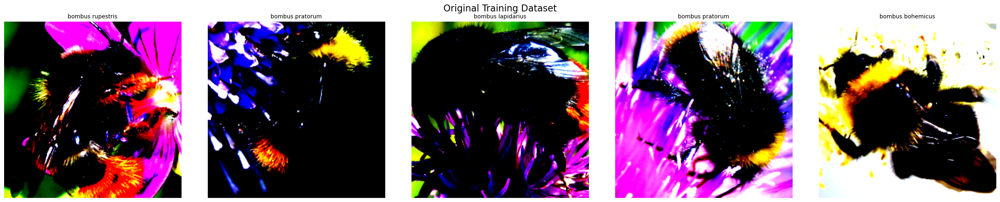

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


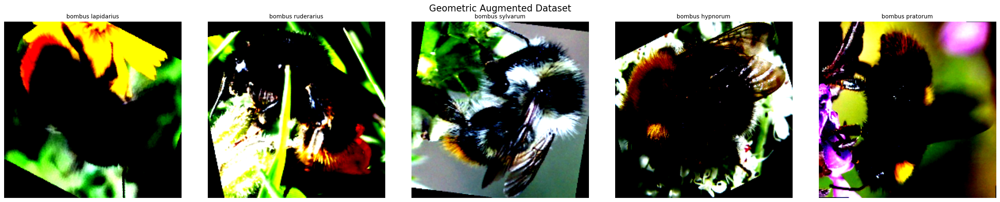

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


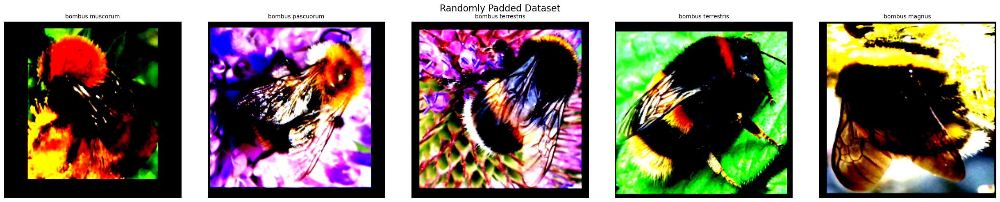

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


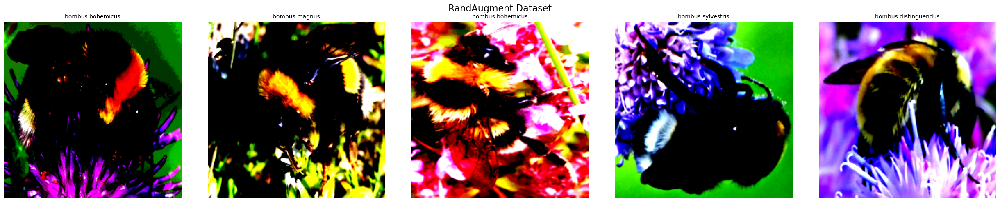

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


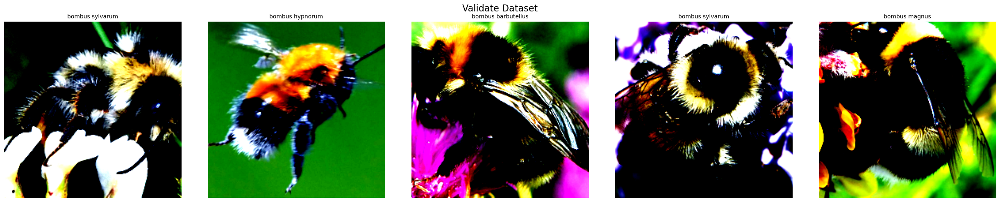

In [46]:
# Plot images from the original training dataset
plot_images(original_train_dataset, 'Original Training Dataset')

# Plot images from the geometric augmented dataset
plot_images(geometric_augmented_dataset, 'Geometric Augmented Dataset')

# Plot images from the randomly padded dataset
plot_images(random_padded_dataset, 'Randomly Padded Dataset')

# Plot images from the RandAugment dataset
plot_images(randaugment_dataset, 'RandAugment Dataset')

# Plot images from the validate dataset
plot_images(validate_dataset, 'Validate Dataset')

In [47]:
# Combine augmented datasets
combined_dataset = ConcatDataset([
    original_train_dataset,
    geometric_augmented_dataset,
    random_padded_dataset,
    randaugment_dataset
])

In [48]:
num_workers = 4

train_loader_final = DataLoader(combined_dataset, batch_size=batch_size, 
                                shuffle=True, num_workers=num_workers)
validate_dataloader = DataLoader(validate_dataset, batch_size=batch_size,
                                shuffle=True, num_workers=num_workers)

In [49]:
dataloaders_dict = {
    'train': train_loader_final,
    'validate': validate_dataloader
}

In [50]:
# Get a mapping of the indices to the class names, in order to see the output classes of the test images.
idx_to_class = {v: k for k, v in original_train_dataset.class_to_idx.items()}
print(idx_to_class)

{0: 'bombus barbutellus', 1: 'bombus bohemicus', 2: 'bombus campestris', 3: 'bombus cryptarum', 4: 'bombus distinguendus', 5: 'bombus hortorum', 6: 'bombus hypnorum', 7: 'bombus jonellus', 8: 'bombus lapidarius', 9: 'bombus lucorum', 10: 'bombus magnus', 11: 'bombus monticola', 12: 'bombus muscorum', 13: 'bombus pascuorum', 14: 'bombus pratorum', 15: 'bombus ruderarius', 16: 'bombus rupestris', 17: 'bombus sylvarum', 18: 'bombus sylvestris', 19: 'bombus terrestris', 20: 'bombus vestalis'}


In [51]:
# Initialize an empty dictionary for the mapping
idx_to_class = {}

# Iterate through each dataset in the ConcatDataset
for dataset in combined_dataset.datasets:
    # Assuming each dataset has a 'class_to_idx' attribute
    idx_to_class.update({v: k for k, v in dataset.class_to_idx.items()})

print(idx_to_class)

{0: 'bombus barbutellus', 1: 'bombus bohemicus', 2: 'bombus campestris', 3: 'bombus cryptarum', 4: 'bombus distinguendus', 5: 'bombus hortorum', 6: 'bombus hypnorum', 7: 'bombus jonellus', 8: 'bombus lapidarius', 9: 'bombus lucorum', 10: 'bombus magnus', 11: 'bombus monticola', 12: 'bombus muscorum', 13: 'bombus pascuorum', 14: 'bombus pratorum', 15: 'bombus ruderarius', 16: 'bombus rupestris', 17: 'bombus sylvarum', 18: 'bombus sylvestris', 19: 'bombus terrestris', 20: 'bombus vestalis'}


In [52]:
# Size of train and validate data
train_data_size = len(combined_dataset)
validate_data_size = len(validate_dataset)

print(train_data_size, validate_data_size)

12096 756


In [53]:
# Detect if GPU is available
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device

device(type='cpu')

In [54]:
# Number of epochs for training
num_epochs = 30

# Values for decaying
step_size = 6
gamma = 0.9

# Flag for feature extracting. When False, we finetune the whole model, 
# When True we only update the reshaped layer params
feature_extract = True

<br> </br>
<h1 style="font-size: 28px; text-align: center; color: purple"> 3.1 SqueezeNet1_1 </h1>
<br> </br>

In [25]:
# Models to choose from: ['squeezenet', 'mnasnet', 'densenet', 'shufflenet', 'googlenet']
model_name = "squeezenet"

In [26]:
# Initialize the model
model_ft = initialize_model(model_name, num_classes, feature_extract)

# Print the model instantiated
print(model_ft)

SqueezeNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
    (3): Fire(
      (squeeze): Conv2d(64, 16, kernel_size=(1, 1), stride=(1, 1))
      (squeeze_activation): ReLU(inplace=True)
      (expand1x1): Conv2d(16, 64, kernel_size=(1, 1), stride=(1, 1))
      (expand1x1_activation): ReLU(inplace=True)
      (expand3x3): Conv2d(16, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (expand3x3_activation): ReLU(inplace=True)
    )
    (4): Fire(
      (squeeze): Conv2d(128, 16, kernel_size=(1, 1), stride=(1, 1))
      (squeeze_activation): ReLU(inplace=True)
      (expand1x1): Conv2d(16, 64, kernel_size=(1, 1), stride=(1, 1))
      (expand1x1_activation): ReLU(inplace=True)
      (expand3x3): Conv2d(16, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (expand3x3_activation): ReLU(inplace=True)
    )
    (5): MaxPool2d

In [27]:
# # Set all parameters to require gradients
# for param in model_ft.parameters():
#     param.requires_grad = True

# Move the model to the specified device
model_ft = model_ft.to(device)

# Print the parameters
params_to_update = model_ft.parameters()
print("Params to learn:")
for name, param in model_ft.named_parameters():
    if param.requires_grad:
        print("\t", name)
        
# Observe that all parameters are being optimized
optimizer_ft = optim.Adam(model_ft.parameters(), lr=0.001)

Params to learn:
	 classifier.1.weight
	 classifier.1.bias


In [28]:
# Setup the loss function
criterion = nn.CrossEntropyLoss()

In [29]:
model_squeezenet, result_squeezenet = train_model(model_ft, dataloaders_dict, 
                                                  criterion, optimizer_ft, 
                                                  num_epochs=num_epochs,
                                                  is_squeezenet=(model_name=="squeezenet"))

Adjusting learning rate of group 0 to 1.0000e-03.
Epoch: 001/030
Adjusting learning rate of group 0 to 1.0000e-03.
Train Loss: 2.2290 Accuracy: 32.7960%
Validate Loss: 1.8358 Accuracy: 42.9894%
Epoch duration: 67.8459s

Epoch: 002/030
Adjusting learning rate of group 0 to 1.0000e-03.
Train Loss: 1.5803 Accuracy: 50.7440%
Validate Loss: 1.7080 Accuracy: 45.1058%
Epoch duration: 68.0414s

Epoch: 003/030
Adjusting learning rate of group 0 to 1.0000e-03.
Train Loss: 1.3692 Accuracy: 57.5645%
Validate Loss: 1.6481 Accuracy: 48.1481%
Epoch duration: 59.0413s

Epoch: 004/030
Adjusting learning rate of group 0 to 1.0000e-03.
Train Loss: 1.2436 Accuracy: 61.1194%
Validate Loss: 1.5324 Accuracy: 49.6032%
Epoch duration: 66.7192s

Epoch: 005/030
Adjusting learning rate of group 0 to 1.0000e-03.
Train Loss: 1.1632 Accuracy: 63.3598%
Validate Loss: 1.6446 Accuracy: 50.5291%
Epoch duration: 57.1298s

Epoch: 006/030
Adjusting learning rate of group 0 to 1.0000e-03.
Train Loss: 1.1129 Accuracy: 64.690

In [30]:
# model_squeezenet, result_squeezenet = train_model_with_early_stopping(model_ft, dataloaders_dict,
#                                                                       criterion, optimizer_ft,
#                                                                       exp_lr_scheduler, num_epochs=num_epochs,
#                                                                       is_squeezenet=(model_name=="squeezenet"),
#                                                                       patience=15)

In [62]:
torch.save(model_squeezenet.state_dict(), "model_squeezenet.pth")

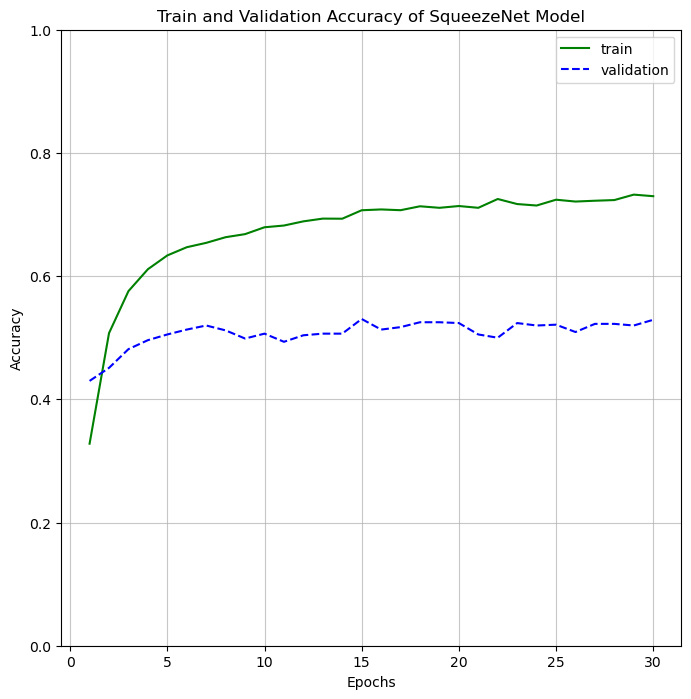

In [38]:
plot_accuracy_pytorch(num_epochs, result_squeezenet, 'SqueezeNet')

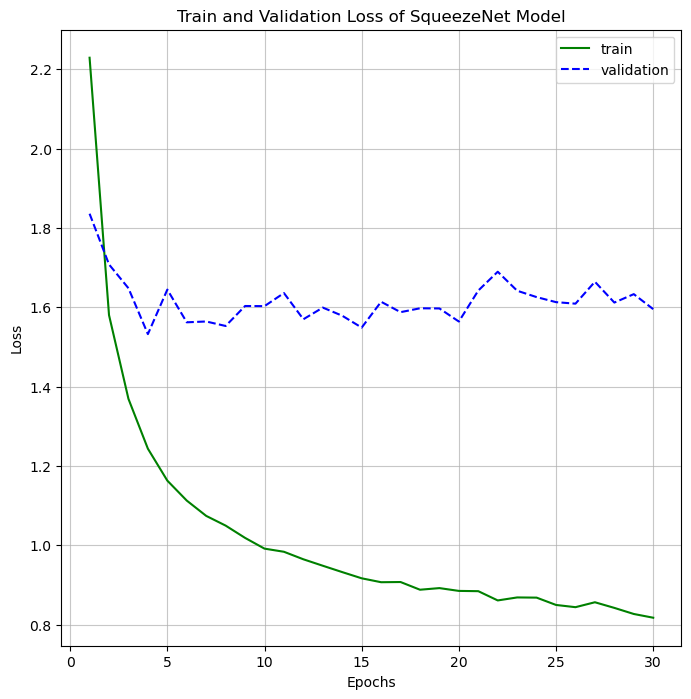

In [39]:
plot_loss_pytorch(num_epochs, result_squeezenet, 'SqueezeNet')

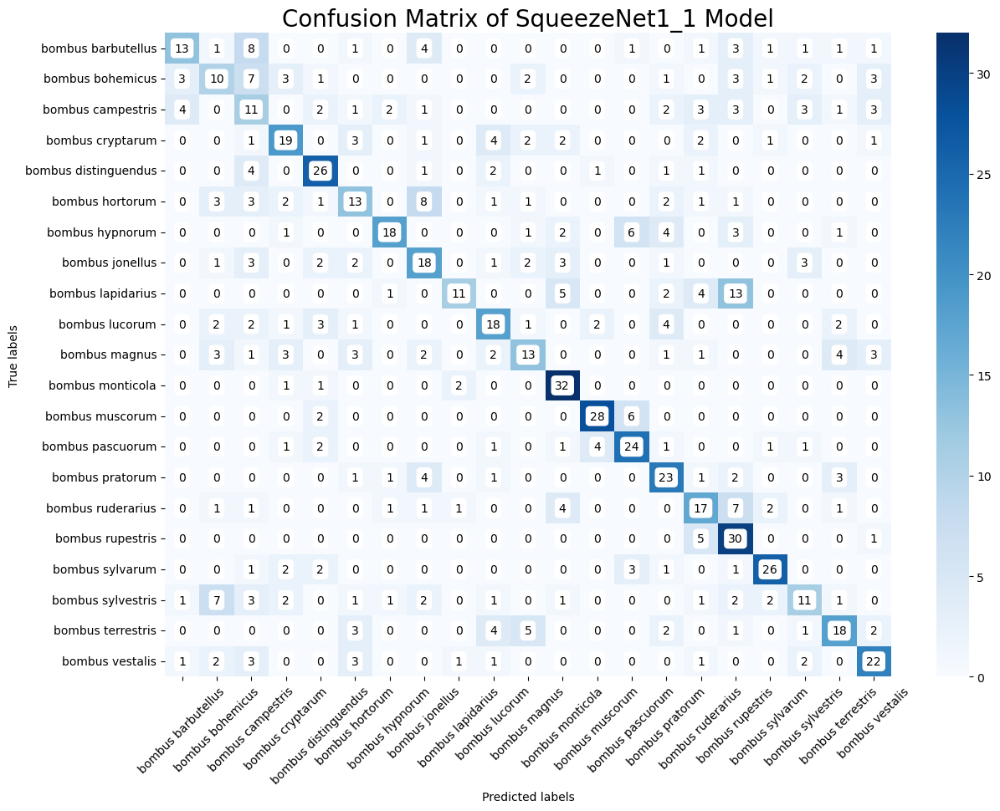

In [40]:
plot_confusion_matrix_pytorch(model_squeezenet, dataloaders_dict['validate'], 
                              idx_to_class, 'SqueezeNet1_1')

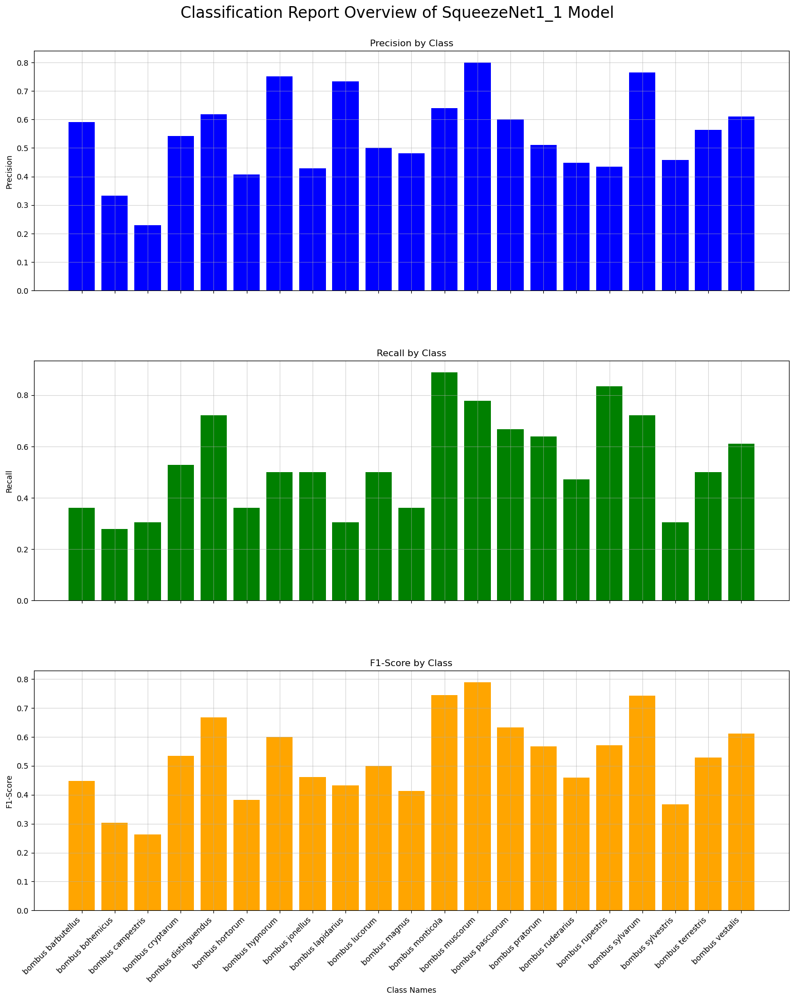

In [41]:
plot_classification_report_pytorch(model_squeezenet, dataloaders_dict['validate'], 
                                   idx_to_class, "SqueezeNet1_1")

In [42]:
print_classification_report_pytorch(model_squeezenet, dataloaders_dict['validate'], 
                                    idx_to_class, "SqueezeNet1_1")

Classification Report of SqueezeNet1_1 Model:
                       precision    recall  f1-score   support

  bombus barbutellus       0.59      0.36      0.45        36
    bombus bohemicus       0.33      0.28      0.30        36
   bombus campestris       0.23      0.31      0.26        36
    bombus cryptarum       0.54      0.53      0.54        36
bombus distinguendus       0.62      0.72      0.67        36
     bombus hortorum       0.41      0.36      0.38        36
     bombus hypnorum       0.75      0.50      0.60        36
     bombus jonellus       0.43      0.50      0.46        36
   bombus lapidarius       0.73      0.31      0.43        36
      bombus lucorum       0.50      0.50      0.50        36
       bombus magnus       0.48      0.36      0.41        36
    bombus monticola       0.64      0.89      0.74        36
     bombus muscorum       0.80      0.78      0.79        36
    bombus pascuorum       0.60      0.67      0.63        36
     bombus pratorum  

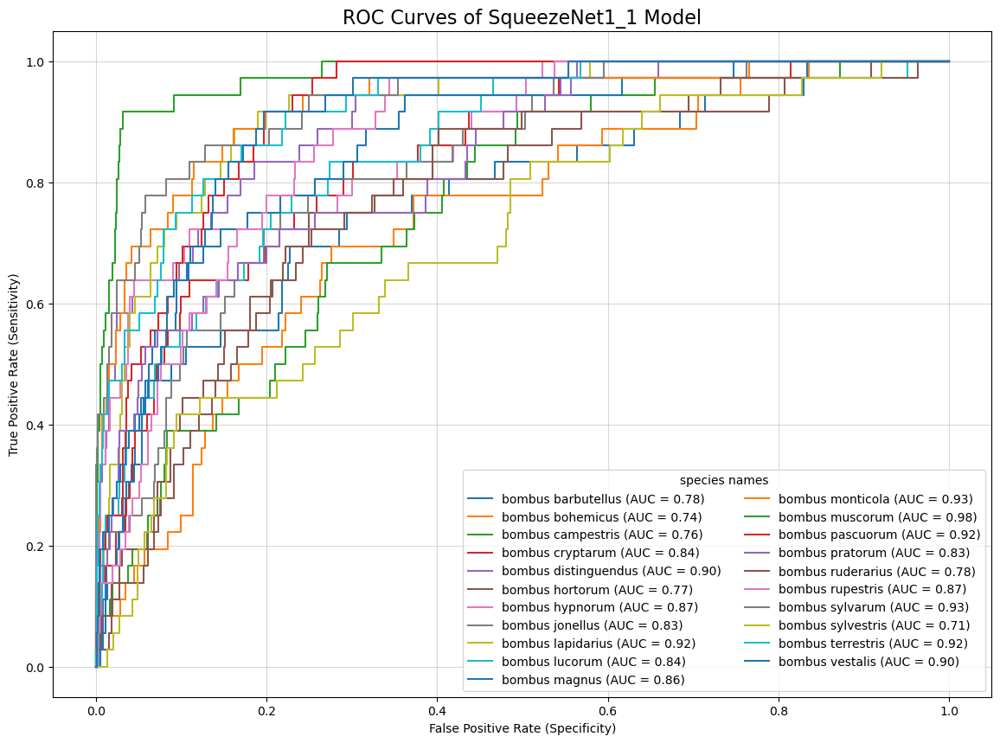

In [43]:
plot_roc_curves_pytorch(model_squeezenet, dataloaders_dict['validate'], 
                        idx_to_class, "SqueezeNet1_1")

<br> </br>
<h1 style="font-size: 28px; text-align: center; color: purple"> 3.2 DenseNet121 </h1>
<br> </br>

In [44]:
# Models to choose from: ['squeezenet', 'mnasnet', 'densenet', 'shufflenet', 'googlenet']
model_name = "densenet"

In [45]:
# Initialize the model
model_ft = initialize_model(model_name, num_classes, feature_extract)

# Print the model just instantiated
print(model_ft)

DenseNet(
  (features): Sequential(
    (conv0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (norm0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu0): ReLU(inplace=True)
    (pool0): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (denseblock1): _DenseBlock(
      (denselayer1): _DenseLayer(
        (norm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu1): ReLU(inplace=True)
        (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (norm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu2): ReLU(inplace=True)
        (conv2): Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      )
      (denselayer2): _DenseLayer(
        (norm1): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu

In [46]:
# Set all parameters to require gradients
for param in model_ft.parameters():
    param.requires_grad = True

# Move the model to the specified device
model_ft = model_ft.to(device)

# Print the parameters
params_to_update = model_ft.parameters()
print("Params to learn:")
for name, param in model_ft.named_parameters():
    if param.requires_grad:
        print("\t", name)
        
# Observe that all parameters are being optimized
optimizer_ft = optim.Adam(model_ft.parameters(), lr=0.001)

Params to learn:
	 features.conv0.weight
	 features.norm0.weight
	 features.norm0.bias
	 features.denseblock1.denselayer1.norm1.weight
	 features.denseblock1.denselayer1.norm1.bias
	 features.denseblock1.denselayer1.conv1.weight
	 features.denseblock1.denselayer1.norm2.weight
	 features.denseblock1.denselayer1.norm2.bias
	 features.denseblock1.denselayer1.conv2.weight
	 features.denseblock1.denselayer2.norm1.weight
	 features.denseblock1.denselayer2.norm1.bias
	 features.denseblock1.denselayer2.conv1.weight
	 features.denseblock1.denselayer2.norm2.weight
	 features.denseblock1.denselayer2.norm2.bias
	 features.denseblock1.denselayer2.conv2.weight
	 features.denseblock1.denselayer3.norm1.weight
	 features.denseblock1.denselayer3.norm1.bias
	 features.denseblock1.denselayer3.conv1.weight
	 features.denseblock1.denselayer3.norm2.weight
	 features.denseblock1.denselayer3.norm2.bias
	 features.denseblock1.denselayer3.conv2.weight
	 features.denseblock1.denselayer4.norm1.weight
	 features.de

In [47]:
# Setup the loss function
criterion = nn.CrossEntropyLoss()

In [48]:
model_densenet, result_densenet = train_model(model_ft, dataloaders_dict, 
                                              criterion, optimizer_ft, 
                                              num_epochs=num_epochs, 
                                              is_squeezenet=(model_name=="densenet"))

Adjusting learning rate of group 0 to 1.0000e-03.
Epoch: 001/030
Adjusting learning rate of group 0 to 1.0000e-03.
Train Loss: 1.5000 Accuracy: 52.0420%
Validate Loss: 1.3049 Accuracy: 58.0688%
Epoch duration: 1093.1080s

Epoch: 002/030
Adjusting learning rate of group 0 to 1.0000e-03.
Train Loss: 0.7734 Accuracy: 74.4048%
Validate Loss: 1.2260 Accuracy: 61.2434%
Epoch duration: 1110.8126s

Epoch: 003/030
Adjusting learning rate of group 0 to 1.0000e-03.
Train Loss: 0.5162 Accuracy: 82.9613%
Validate Loss: 1.0162 Accuracy: 66.5344%
Epoch duration: 1118.2883s

Epoch: 004/030
Adjusting learning rate of group 0 to 1.0000e-03.
Train Loss: 0.4238 Accuracy: 85.9623%
Validate Loss: 0.8412 Accuracy: 72.4868%
Epoch duration: 1115.0788s

Epoch: 005/030
Adjusting learning rate of group 0 to 1.0000e-03.
Train Loss: 0.3112 Accuracy: 89.6825%
Validate Loss: 0.8883 Accuracy: 73.2804%
Epoch duration: 1254.8431s

Epoch: 006/030
Adjusting learning rate of group 0 to 1.0000e-03.
Train Loss: 0.2744 Accura

In [49]:
# model_densenet, result_densenet = train_model_with_early_stopping(model_ft, dataloaders_dict,
#                                                                   criterion, optimizer_ft,
#                                                                   exp_lr_scheduler, num_epochs=num_epochs,
#                                                                   is_squeezenet=(model_name=="densenet"),
#                                                                   patience=5)

In [50]:
torch.save(model_densenet.state_dict(), "model_densenet.pth")

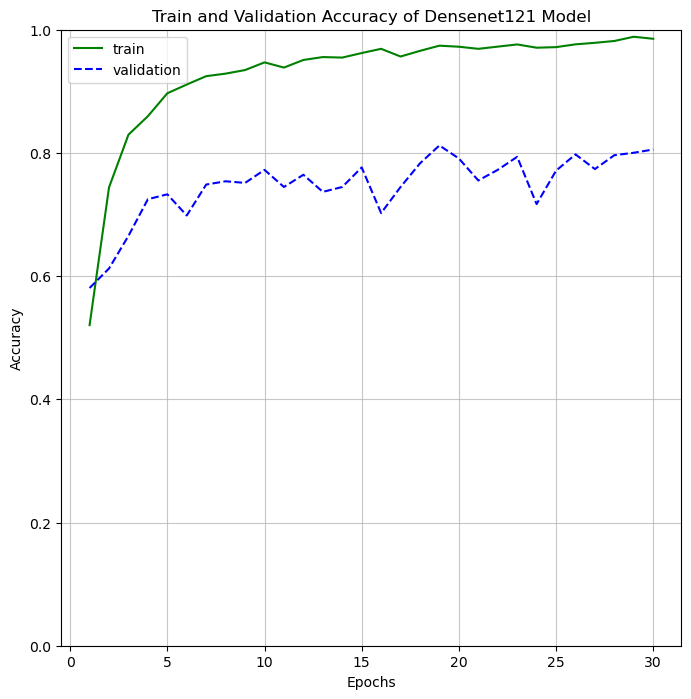

In [51]:
plot_accuracy_pytorch(num_epochs, result_densenet, 'Densenet121')

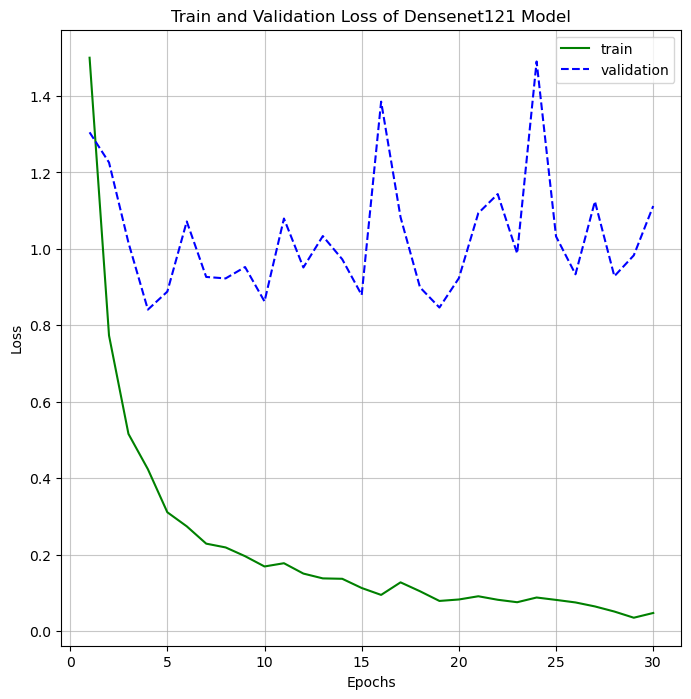

In [52]:
plot_loss_pytorch(num_epochs, result_densenet, 'Densenet121')

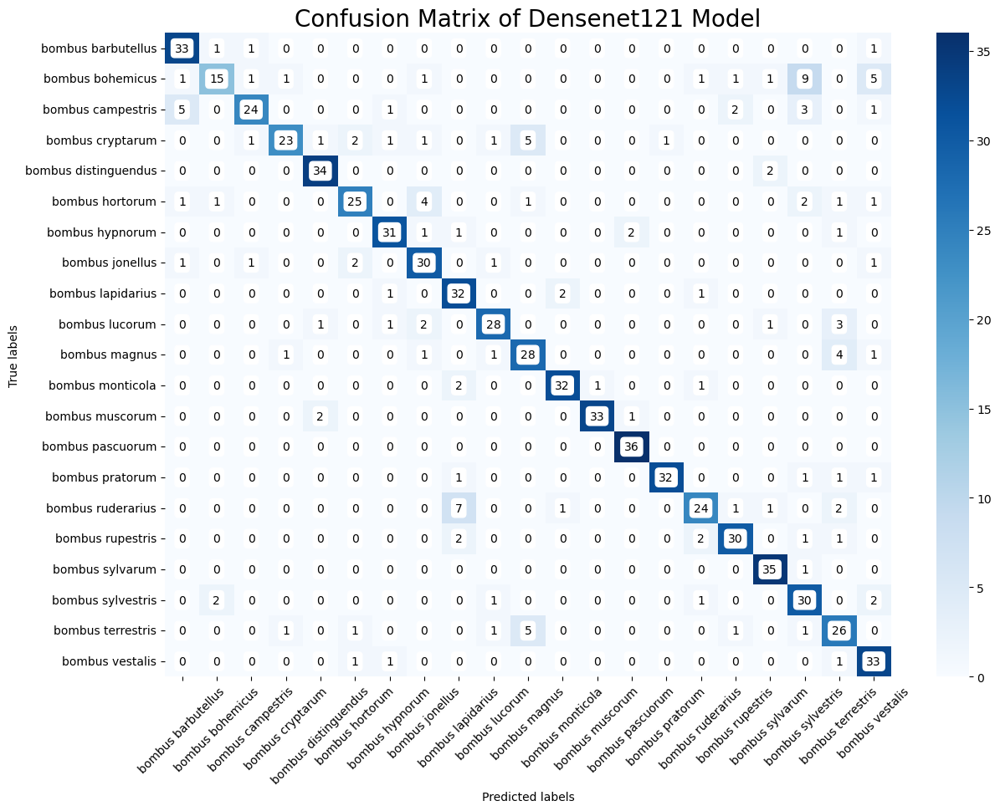

In [53]:
plot_confusion_matrix_pytorch(model_densenet, dataloaders_dict['validate'], 
                              idx_to_class, 'Densenet121')

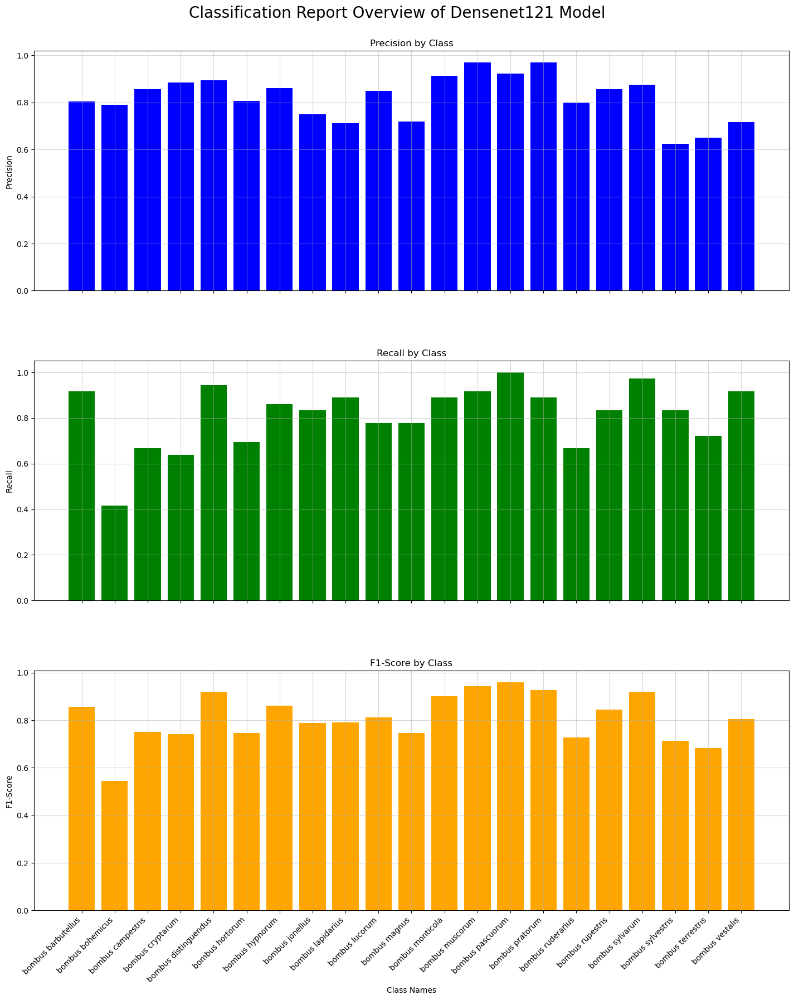

In [54]:
plot_classification_report_pytorch(model_densenet, dataloaders_dict['validate'], 
                                   idx_to_class, "Densenet121")

In [55]:
print_classification_report_pytorch(model_densenet, dataloaders_dict['validate'], 
                                    idx_to_class, "Densenet121")

Classification Report of Densenet121 Model:
                       precision    recall  f1-score   support

  bombus barbutellus       0.80      0.92      0.86        36
    bombus bohemicus       0.79      0.42      0.55        36
   bombus campestris       0.86      0.67      0.75        36
    bombus cryptarum       0.88      0.64      0.74        36
bombus distinguendus       0.89      0.94      0.92        36
     bombus hortorum       0.81      0.69      0.75        36
     bombus hypnorum       0.86      0.86      0.86        36
     bombus jonellus       0.75      0.83      0.79        36
   bombus lapidarius       0.71      0.89      0.79        36
      bombus lucorum       0.85      0.78      0.81        36
       bombus magnus       0.72      0.78      0.75        36
    bombus monticola       0.91      0.89      0.90        36
     bombus muscorum       0.97      0.92      0.94        36
    bombus pascuorum       0.92      1.00      0.96        36
     bombus pratorum    

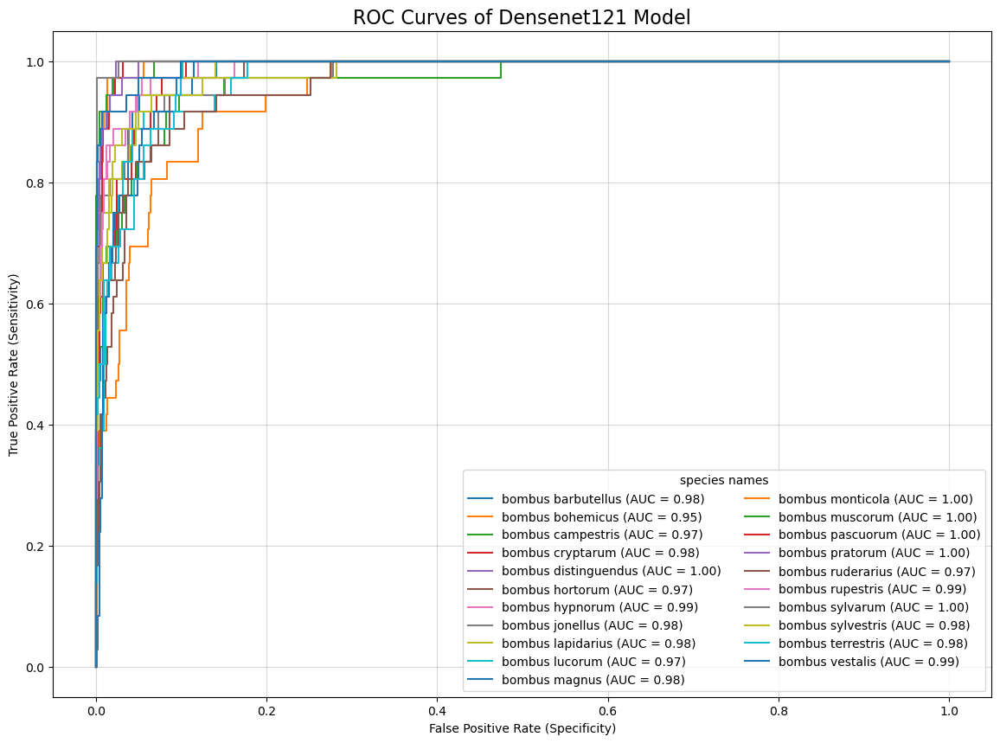

In [56]:
plot_roc_curves_pytorch(model_densenet, dataloaders_dict['validate'], 
                        idx_to_class, "Densenet121")

<br> </br>
<h1 style="font-size: 28px; text-align: center; color: purple"> 3.3 ShuffleNetV2 </h1>
<br> </br>

In [25]:
# Models to choose from: ['squeezenet', 'mnasnet', 'densenet', 'shufflenet', 'googlenet']
model_name = "shufflenet"

In [26]:
# Initialize the model
model_ft = initialize_model(model_name, num_classes, feature_extract)

# Print the model just instantiated
print(model_ft)

ShuffleNetV2(
  (conv1): Sequential(
    (0): Conv2d(3, 24, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(24, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (stage2): Sequential(
    (0): InvertedResidual(
      (branch1): Sequential(
        (0): Conv2d(24, 24, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), groups=24, bias=False)
        (1): BatchNorm2d(24, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): Conv2d(24, 122, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (3): BatchNorm2d(122, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (4): ReLU(inplace=True)
      )
      (branch2): Sequential(
        (0): Conv2d(24, 122, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (1): BatchNorm2d(122, eps=1e-05, momentum=0.1, affine=True, track_runn

In [27]:
# Set all parameters to require gradients
for param in model_ft.parameters():
    param.requires_grad = True

# Move the model to the specified device
model_ft = model_ft.to(device)

# Print the parameters
params_to_update = model_ft.parameters()
print("Params to learn:")
for name, param in model_ft.named_parameters():
    if param.requires_grad:
        print("\t", name)
        
# Observe that all parameters are being optimized
optimizer_ft = optim.Adam(model_ft.parameters(), lr=0.001)

Params to learn:
	 conv1.0.weight
	 conv1.1.weight
	 conv1.1.bias
	 stage2.0.branch1.0.weight
	 stage2.0.branch1.1.weight
	 stage2.0.branch1.1.bias
	 stage2.0.branch1.2.weight
	 stage2.0.branch1.3.weight
	 stage2.0.branch1.3.bias
	 stage2.0.branch2.0.weight
	 stage2.0.branch2.1.weight
	 stage2.0.branch2.1.bias
	 stage2.0.branch2.3.weight
	 stage2.0.branch2.4.weight
	 stage2.0.branch2.4.bias
	 stage2.0.branch2.5.weight
	 stage2.0.branch2.6.weight
	 stage2.0.branch2.6.bias
	 stage2.1.branch2.0.weight
	 stage2.1.branch2.1.weight
	 stage2.1.branch2.1.bias
	 stage2.1.branch2.3.weight
	 stage2.1.branch2.4.weight
	 stage2.1.branch2.4.bias
	 stage2.1.branch2.5.weight
	 stage2.1.branch2.6.weight
	 stage2.1.branch2.6.bias
	 stage2.2.branch2.0.weight
	 stage2.2.branch2.1.weight
	 stage2.2.branch2.1.bias
	 stage2.2.branch2.3.weight
	 stage2.2.branch2.4.weight
	 stage2.2.branch2.4.bias
	 stage2.2.branch2.5.weight
	 stage2.2.branch2.6.weight
	 stage2.2.branch2.6.bias
	 stage2.3.branch2.0.weight
	 st

In [28]:
# Setup the loss function
criterion = nn.CrossEntropyLoss()

In [29]:
model_shufflenet, result_shufflenet = train_model(model_ft, dataloaders_dict, 
                                                  criterion, optimizer_ft, 
                                                  num_epochs=num_epochs, 
                                                  is_squeezenet=(model_name=="shufflenet"))

Adjusting learning rate of group 0 to 1.0000e-03.
Epoch: 001/030
Adjusting learning rate of group 0 to 1.0000e-03.
Train Loss: 0.9591 Accuracy: 71.2880%
Validate Loss: 0.7901 Accuracy: 74.8677%
Epoch duration: 318.6055s

Epoch: 002/030
Adjusting learning rate of group 0 to 1.0000e-03.
Train Loss: 0.3097 Accuracy: 89.7404%
Validate Loss: 1.0821 Accuracy: 71.8254%
Epoch duration: 320.6458s

Epoch: 003/030
Adjusting learning rate of group 0 to 1.0000e-03.
Train Loss: 0.1984 Accuracy: 93.5764%
Validate Loss: 0.9760 Accuracy: 73.8095%
Epoch duration: 342.9599s

Epoch: 004/030
Adjusting learning rate of group 0 to 1.0000e-03.
Train Loss: 0.1698 Accuracy: 94.2460%
Validate Loss: 0.9556 Accuracy: 75.5291%
Epoch duration: 327.4751s

Epoch: 005/030
Adjusting learning rate of group 0 to 1.0000e-03.
Train Loss: 0.1594 Accuracy: 94.7255%
Validate Loss: 1.0276 Accuracy: 73.6772%
Epoch duration: 312.6854s

Epoch: 006/030
Adjusting learning rate of group 0 to 9.0000e-04.
Train Loss: 0.0816 Accuracy: 9

In [30]:
# model_shufflenet, result_shufflenet = train_model_with_early_stopping(model_ft, dataloaders_dict,
#                                                                       criterion, optimizer_ft,
#                                                                       exp_lr_scheduler, num_epochs=num_epochs,
#                                                                       is_squeezenet=(model_name=="shufflenet"),
#                                                                       patience=5)

In [31]:
torch.save(model_shufflenet.state_dict(), "model_shufflenet.pth")

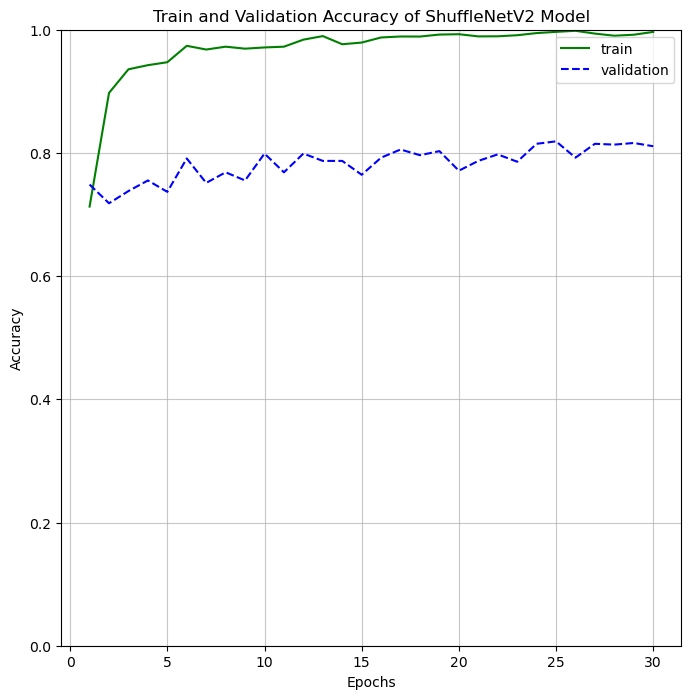

In [39]:
plot_accuracy_pytorch(num_epochs, result_shufflenet, 'ShuffleNetV2')

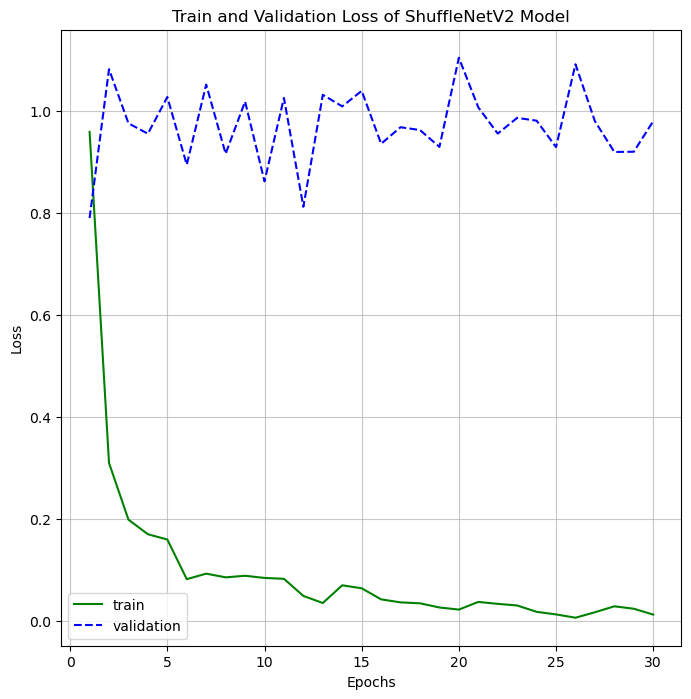

In [40]:
plot_loss_pytorch(num_epochs, result_shufflenet, 'ShuffleNetV2')

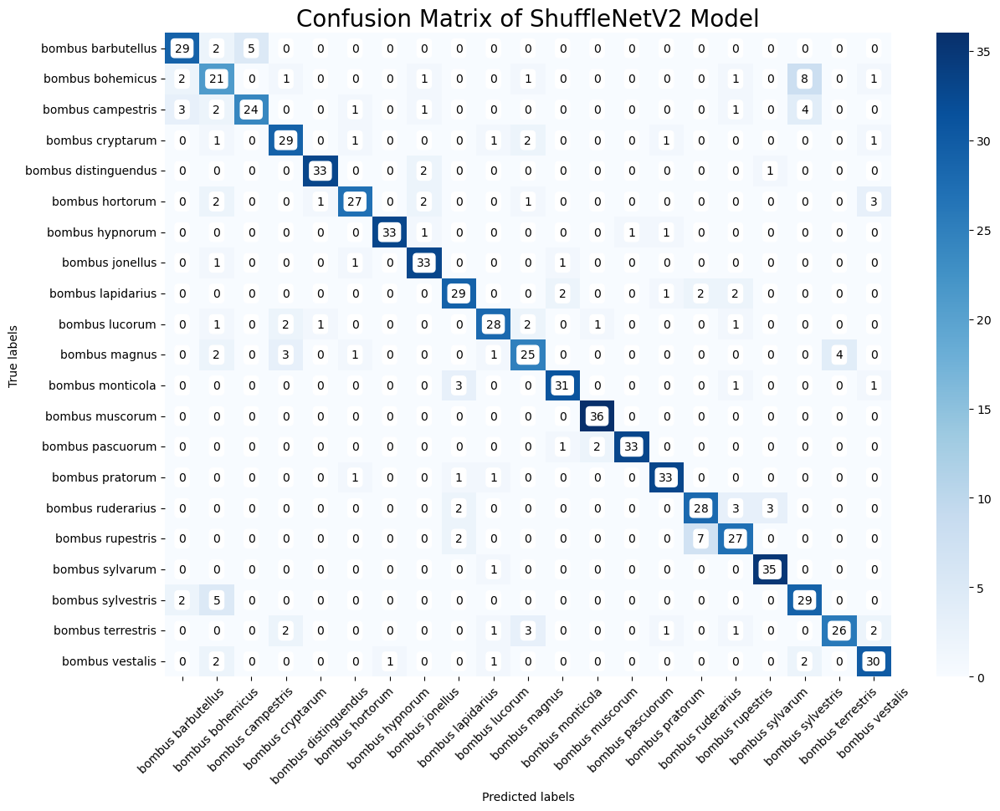

In [41]:
plot_confusion_matrix_pytorch(model_shufflenet, dataloaders_dict['validate'], 
                              idx_to_class, 'ShuffleNetV2')

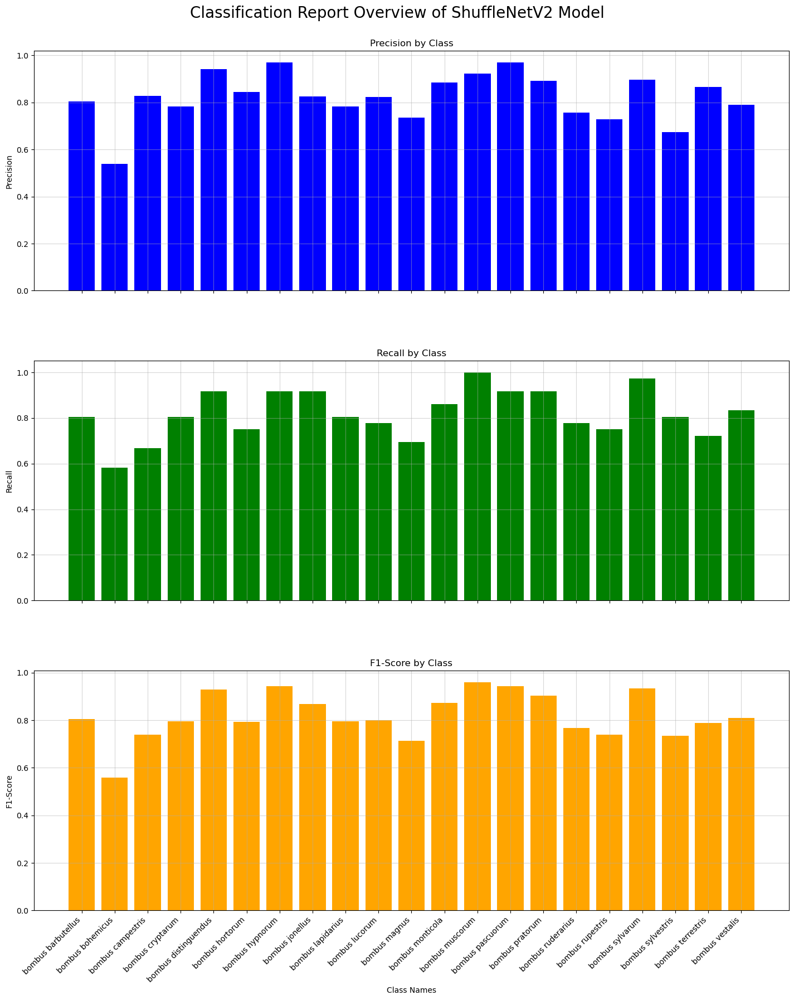

In [42]:
plot_classification_report_pytorch(model_shufflenet, dataloaders_dict['validate'], 
                                   idx_to_class, "ShuffleNetV2")

In [43]:
print_classification_report_pytorch(model_shufflenet, dataloaders_dict['validate'], 
                                    idx_to_class, "ShuffleNetV2")

Classification Report of ShuffleNetV2 Model:
                       precision    recall  f1-score   support

  bombus barbutellus       0.81      0.81      0.81        36
    bombus bohemicus       0.54      0.58      0.56        36
   bombus campestris       0.83      0.67      0.74        36
    bombus cryptarum       0.78      0.81      0.79        36
bombus distinguendus       0.94      0.92      0.93        36
     bombus hortorum       0.84      0.75      0.79        36
     bombus hypnorum       0.97      0.92      0.94        36
     bombus jonellus       0.82      0.92      0.87        36
   bombus lapidarius       0.78      0.81      0.79        36
      bombus lucorum       0.82      0.78      0.80        36
       bombus magnus       0.74      0.69      0.71        36
    bombus monticola       0.89      0.86      0.87        36
     bombus muscorum       0.92      1.00      0.96        36
    bombus pascuorum       0.97      0.92      0.94        36
     bombus pratorum   

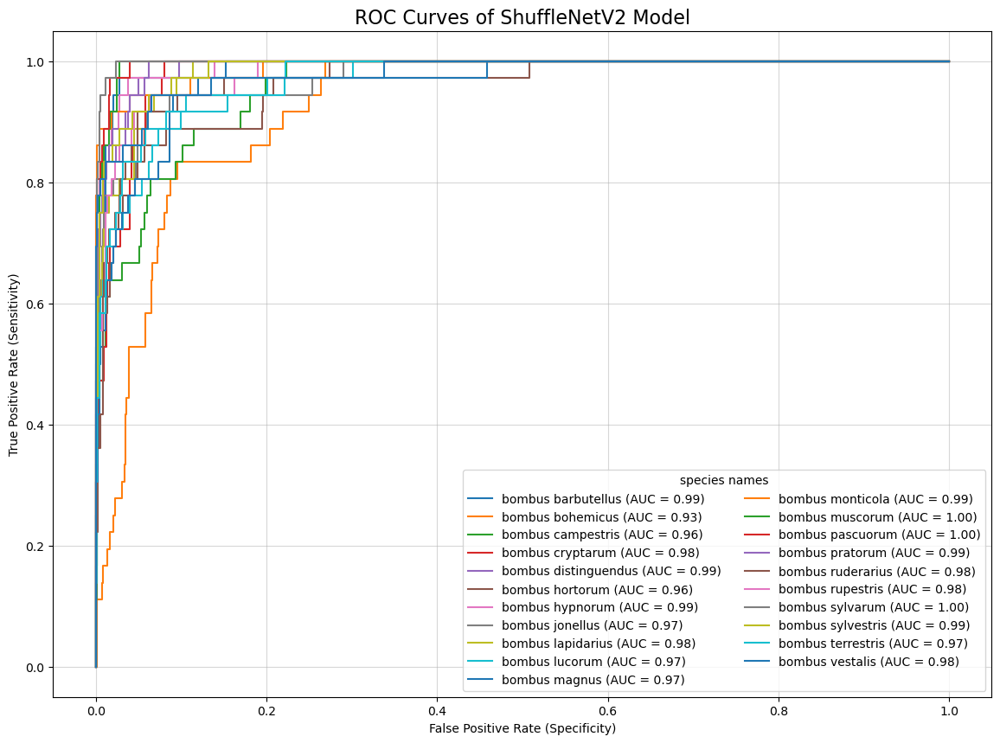

In [44]:
plot_roc_curves_pytorch(model_shufflenet, dataloaders_dict['validate'], 
                        idx_to_class, "ShuffleNetV2")

<br> </br>
<h1 style="font-size: 28px; text-align: center; color: purple"> 3.4 GoogleNet </h1>
<br> </br>

In [45]:
# Models to choose from: ['squeezenet', 'mnasnet', 'densenet', 'shufflenet', 'googlenet']
model_name = "googlenet"

In [46]:
# Initialize the model
model_ft = initialize_model(model_name, num_classes, feature_extract)

# Print the model just instantiated
print(model_ft)

GoogLeNet(
  (conv1): BasicConv2d(
    (conv): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
  (conv2): BasicConv2d(
    (conv): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv3): BasicConv2d(
    (conv): Conv2d(64, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(192, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
  (inception3a): Inception(
    (branch1): BasicConv2d(
      (conv): Conv2d(192, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track

In [47]:
# Set all parameters to require gradients
for param in model_ft.parameters():
    param.requires_grad = True

# Move the model to the specified device
model_ft = model_ft.to(device)

# Print the parameters
params_to_update = model_ft.parameters()
print("Params to learn:")
for name, param in model_ft.named_parameters():
    if param.requires_grad:
        print("\t", name)
        
# Observe that all parameters are being optimized
optimizer_ft = optim.Adam(model_ft.parameters(), lr=0.001)

Params to learn:
	 conv1.conv.weight
	 conv1.bn.weight
	 conv1.bn.bias
	 conv2.conv.weight
	 conv2.bn.weight
	 conv2.bn.bias
	 conv3.conv.weight
	 conv3.bn.weight
	 conv3.bn.bias
	 inception3a.branch1.conv.weight
	 inception3a.branch1.bn.weight
	 inception3a.branch1.bn.bias
	 inception3a.branch2.0.conv.weight
	 inception3a.branch2.0.bn.weight
	 inception3a.branch2.0.bn.bias
	 inception3a.branch2.1.conv.weight
	 inception3a.branch2.1.bn.weight
	 inception3a.branch2.1.bn.bias
	 inception3a.branch3.0.conv.weight
	 inception3a.branch3.0.bn.weight
	 inception3a.branch3.0.bn.bias
	 inception3a.branch3.1.conv.weight
	 inception3a.branch3.1.bn.weight
	 inception3a.branch3.1.bn.bias
	 inception3a.branch4.1.conv.weight
	 inception3a.branch4.1.bn.weight
	 inception3a.branch4.1.bn.bias
	 inception3b.branch1.conv.weight
	 inception3b.branch1.bn.weight
	 inception3b.branch1.bn.bias
	 inception3b.branch2.0.conv.weight
	 inception3b.branch2.0.bn.weight
	 inception3b.branch2.0.bn.bias
	 inception3b.bra

In [48]:
# Setup the loss function
criterion = nn.CrossEntropyLoss()

In [55]:
model_googlenet, result_googlenet = train_model(model_ft, dataloaders_dict, 
                                                criterion, optimizer_ft, 
                                                num_epochs=num_epochs,
                                                is_squeezenet=(model_name=="googlenet"))

Adjusting learning rate of group 0 to 4.7830e-04.
Epoch: 001/030
Adjusting learning rate of group 0 to 4.7830e-04.
Train Loss: 0.0270 Accuracy: 99.1567%
Validate Loss: 1.2061 Accuracy: 77.3810%
Epoch duration: 716.7462s

Epoch: 002/030
Adjusting learning rate of group 0 to 4.7830e-04.
Train Loss: 0.0351 Accuracy: 98.8509%
Validate Loss: 1.0710 Accuracy: 77.3810%
Epoch duration: 491.5577s

Epoch: 003/030
Adjusting learning rate of group 0 to 4.7830e-04.
Train Loss: 0.0319 Accuracy: 99.0245%
Validate Loss: 1.0445 Accuracy: 77.3810%
Epoch duration: 492.9325s

Epoch: 004/030
Adjusting learning rate of group 0 to 4.7830e-04.
Train Loss: 0.0369 Accuracy: 98.7103%
Validate Loss: 1.2479 Accuracy: 76.0582%
Epoch duration: 497.0753s

Epoch: 005/030
Adjusting learning rate of group 0 to 4.7830e-04.
Train Loss: 0.0239 Accuracy: 99.2477%
Validate Loss: 1.1717 Accuracy: 78.8360%
Epoch duration: 494.7427s

Epoch: 006/030
Adjusting learning rate of group 0 to 4.3047e-04.
Train Loss: 0.0215 Accuracy: 9

In [57]:
# model_googlenet, result_googlenet = train_model_with_early_stopping(model_ft, dataloaders_dict,
#                                                                     criterion, optimizer_ft,
#                                                                     exp_lr_scheduler, num_epochs=num_epochs,
#                                                                     is_squeezenet=(model_name=="googlenet"),
#                                                                     patience=5)

In [59]:
torch.save(model_googlenet.state_dict(), "model_googlenet.pth")

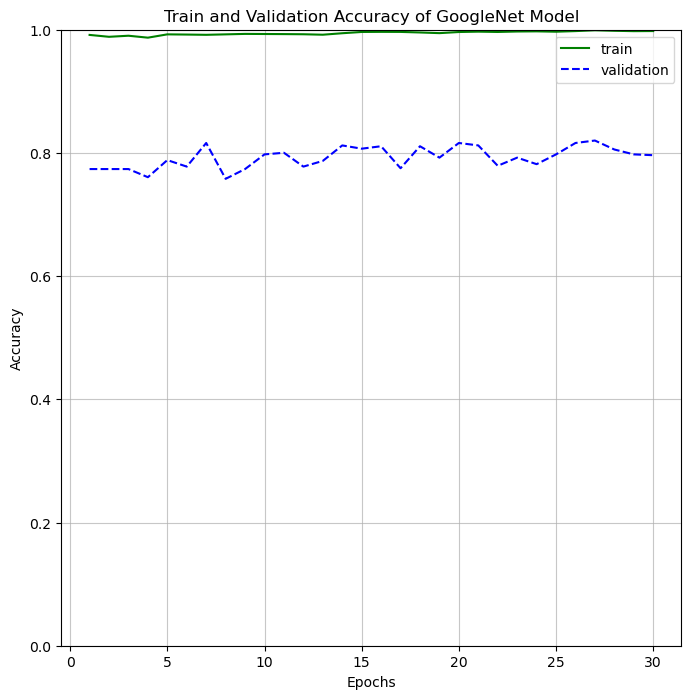

In [61]:
plot_accuracy_pytorch(num_epochs, result_googlenet, 'GoogleNet')

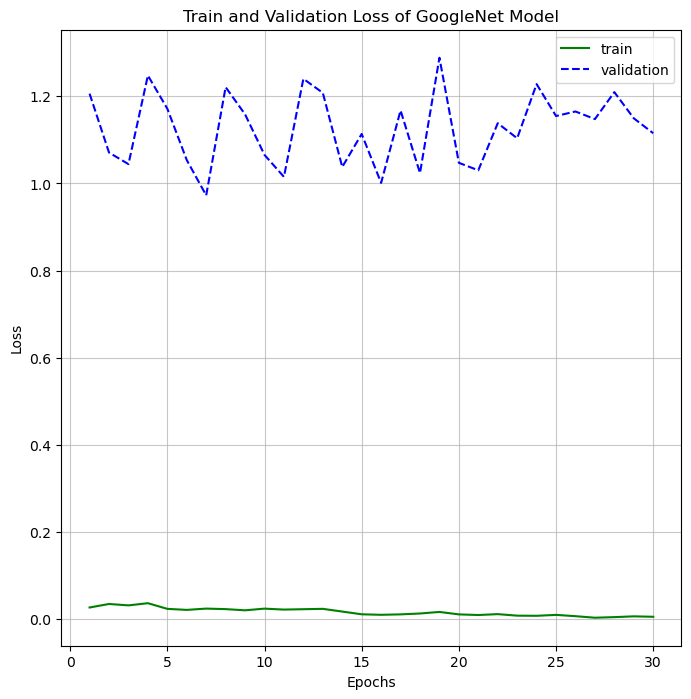

In [63]:
plot_loss_pytorch(num_epochs, result_googlenet, 'GoogleNet')

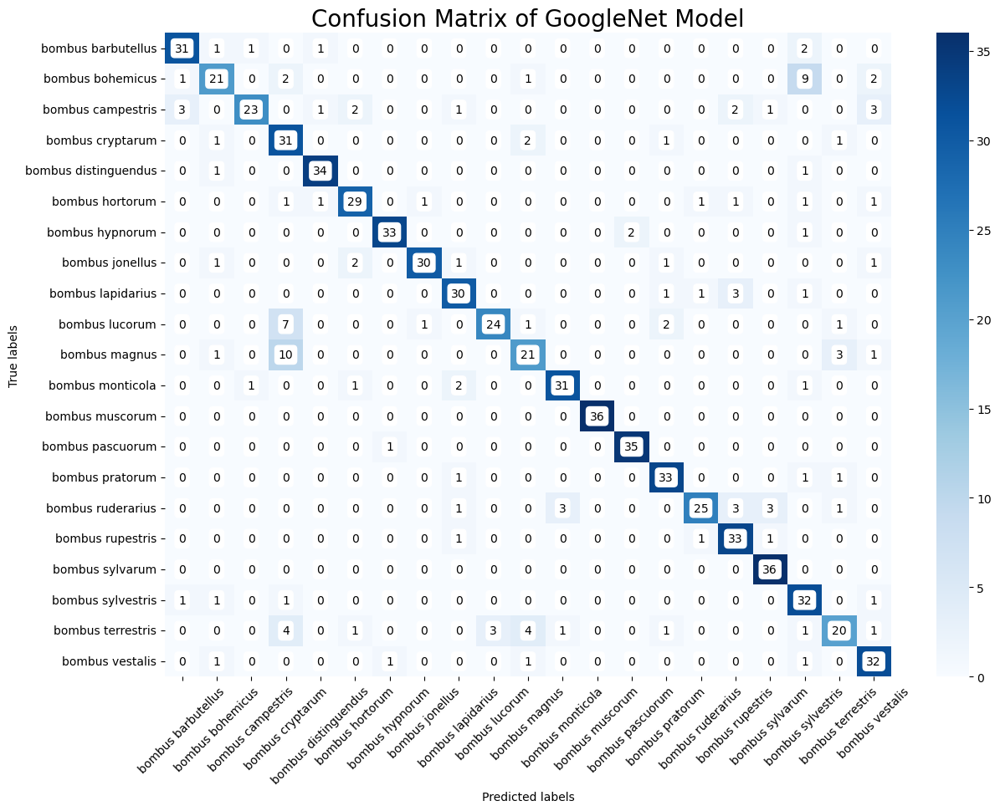

In [65]:
plot_confusion_matrix_pytorch(model_googlenet, dataloaders_dict['validate'], 
                              idx_to_class, 'GoogleNet')

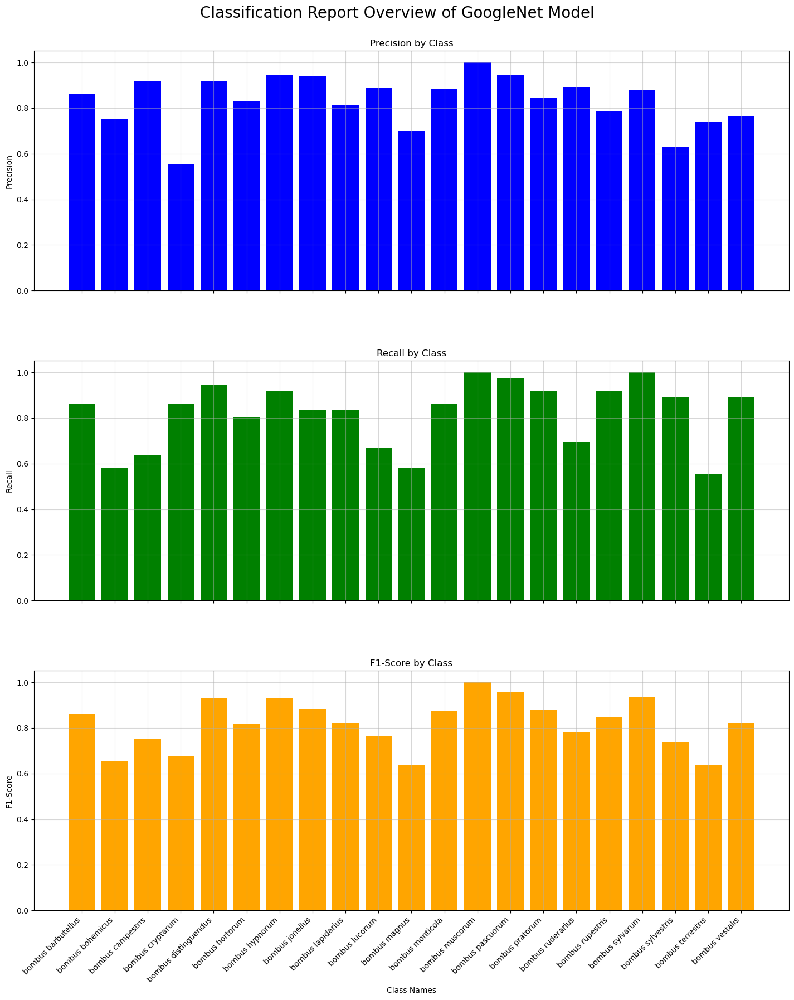

In [67]:
plot_classification_report_pytorch(model_googlenet, dataloaders_dict['validate'], 
                                   idx_to_class, "GoogleNet")

In [69]:
print_classification_report_pytorch(model_googlenet, dataloaders_dict['validate'], 
                                    idx_to_class, "GoogleNet")

Classification Report of GoogleNet Model:
                       precision    recall  f1-score   support

  bombus barbutellus       0.86      0.86      0.86        36
    bombus bohemicus       0.75      0.58      0.66        36
   bombus campestris       0.92      0.64      0.75        36
    bombus cryptarum       0.55      0.86      0.67        36
bombus distinguendus       0.92      0.94      0.93        36
     bombus hortorum       0.83      0.81      0.82        36
     bombus hypnorum       0.94      0.92      0.93        36
     bombus jonellus       0.94      0.83      0.88        36
   bombus lapidarius       0.81      0.83      0.82        36
      bombus lucorum       0.89      0.67      0.76        36
       bombus magnus       0.70      0.58      0.64        36
    bombus monticola       0.89      0.86      0.87        36
     bombus muscorum       1.00      1.00      1.00        36
    bombus pascuorum       0.95      0.97      0.96        36
     bombus pratorum      

In [61]:
plot_roc_curves_pytorch(model_googlenet, dataloaders_dict['validate'], 
                        idx_to_class, "GoogleNet")

NameError: name 'model_googlenet' is not defined

<br> </br>
<h1 style="font-size: 28px; text-align: center; color: purple"> 3.5 MNASNET1_0 </h1>
<br> </br>

In [62]:
# Models to choose from: ['squeezenet', 'mnasnet', 'densenet', 'shufflenet', 'googlenet']
model_name = "mnasnet"

In [63]:
# Initialize the model
model_ft = initialize_model(model_name, num_classes, feature_extract)

# Print the model just instantiated
print(model_ft)

MNASNet(
  (layers): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.00029999999999996696, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
    (4): BatchNorm2d(32, eps=1e-05, momentum=0.00029999999999996696, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (7): BatchNorm2d(16, eps=1e-05, momentum=0.00029999999999996696, affine=True, track_running_stats=True)
    (8): Sequential(
      (0): _InvertedResidual(
        (layers): Sequential(
          (0): Conv2d(16, 48, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (1): BatchNorm2d(48, eps=1e-05, momentum=0.00029999999999996696, affine=True, track_running_stats=True)
          (2): ReLU(inplace=True)
          (3): Conv2d(48, 

In [64]:
# Set all parameters to require gradients
for param in model_ft.parameters():
    param.requires_grad = True

# Move the model to the specified device
model_ft = model_ft.to(device)

# Print the parameters
params_to_update = model_ft.parameters()
print("Params to learn:")
for name, param in model_ft.named_parameters():
    if param.requires_grad:
        print("\t", name)
        
# Observe that all parameters are being optimized
optimizer_ft = optim.Adam(model_ft.parameters(), lr=0.001)

Params to learn:
	 layers.0.weight
	 layers.1.weight
	 layers.1.bias
	 layers.3.weight
	 layers.4.weight
	 layers.4.bias
	 layers.6.weight
	 layers.7.weight
	 layers.7.bias
	 layers.8.0.layers.0.weight
	 layers.8.0.layers.1.weight
	 layers.8.0.layers.1.bias
	 layers.8.0.layers.3.weight
	 layers.8.0.layers.4.weight
	 layers.8.0.layers.4.bias
	 layers.8.0.layers.6.weight
	 layers.8.0.layers.7.weight
	 layers.8.0.layers.7.bias
	 layers.8.1.layers.0.weight
	 layers.8.1.layers.1.weight
	 layers.8.1.layers.1.bias
	 layers.8.1.layers.3.weight
	 layers.8.1.layers.4.weight
	 layers.8.1.layers.4.bias
	 layers.8.1.layers.6.weight
	 layers.8.1.layers.7.weight
	 layers.8.1.layers.7.bias
	 layers.8.2.layers.0.weight
	 layers.8.2.layers.1.weight
	 layers.8.2.layers.1.bias
	 layers.8.2.layers.3.weight
	 layers.8.2.layers.4.weight
	 layers.8.2.layers.4.bias
	 layers.8.2.layers.6.weight
	 layers.8.2.layers.7.weight
	 layers.8.2.layers.7.bias
	 layers.9.0.layers.0.weight
	 layers.9.0.layers.1.weight
	 la

In [65]:
# Setup the loss function
criterion = nn.CrossEntropyLoss()

In [75]:
model_mnasnet, result_mnasnet = train_model(model_ft, dataloaders_dict, 
                                            criterion, optimizer_ft, 
                                            num_epochs=num_epochs,
                                            is_squeezenet=(model_name=="mnasnet"))

Adjusting learning rate of group 0 to 5.3144e-04.
Epoch: 001/030
Adjusting learning rate of group 0 to 5.3144e-04.
Train Loss: 0.0226 Accuracy: 99.2312%
Validate Loss: 3.2086 Accuracy: 61.6402%
Epoch duration: 403.5589s

Epoch: 002/030
Adjusting learning rate of group 0 to 5.3144e-04.
Train Loss: 0.0147 Accuracy: 99.4792%
Validate Loss: 2.4016 Accuracy: 69.0476%
Epoch duration: 403.7953s

Epoch: 003/030
Adjusting learning rate of group 0 to 5.3144e-04.
Train Loss: 0.0202 Accuracy: 99.3221%
Validate Loss: 2.8083 Accuracy: 67.9894%
Epoch duration: 404.2597s

Epoch: 004/030
Adjusting learning rate of group 0 to 5.3144e-04.
Train Loss: 0.0197 Accuracy: 99.3221%
Validate Loss: 2.7653 Accuracy: 67.7249%
Epoch duration: 403.7288s

Epoch: 005/030
Adjusting learning rate of group 0 to 5.3144e-04.
Train Loss: 0.0263 Accuracy: 99.1650%
Validate Loss: 2.4672 Accuracy: 67.5926%
Epoch duration: 405.2633s

Epoch: 006/030
Adjusting learning rate of group 0 to 4.7830e-04.
Train Loss: 0.0290 Accuracy: 9

In [76]:
# model_mnasnet, result_mnasnet = train_model_with_early_stopping(model_ft, dataloaders_dict,
#                                                                 criterion, optimizer_ft,
#                                                                 exp_lr_scheduler, num_epochs=num_epochs,
#                                                                 is_squeezenet=(model_name=="mnasnet"),
#                                                                 patience=5)

In [77]:
torch.save(model_mnasnet.state_dict(), "model_mnasnet.pth")

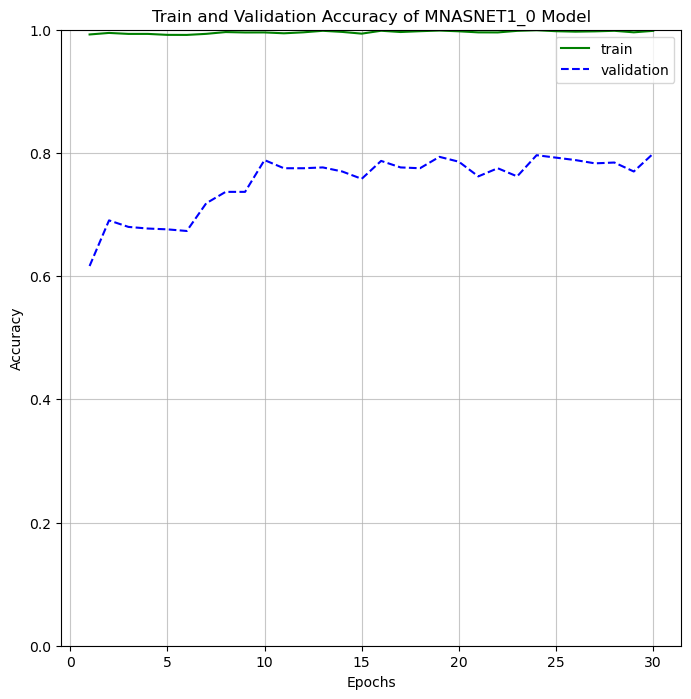

In [78]:
plot_accuracy_pytorch(num_epochs, result_mnasnet, 'MNASNET1_0')

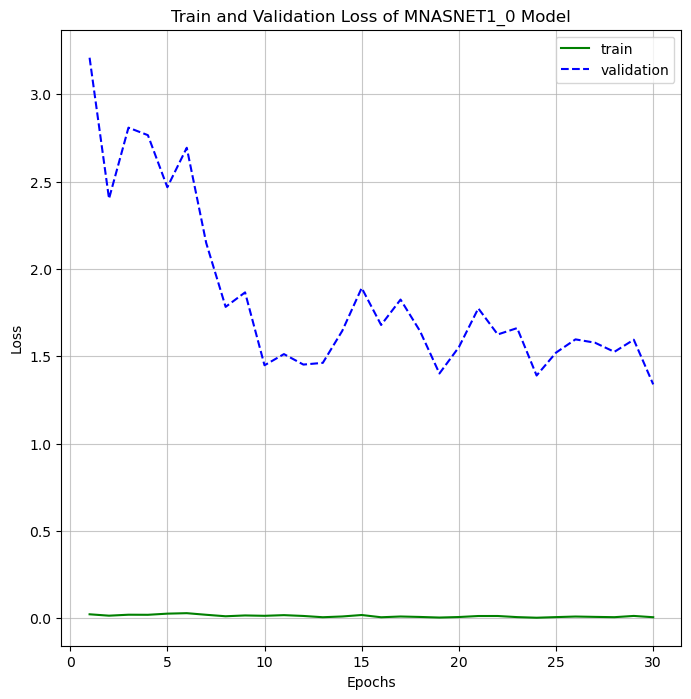

In [79]:
plot_loss_pytorch(num_epochs, result_mnasnet, 'MNASNET1_0')

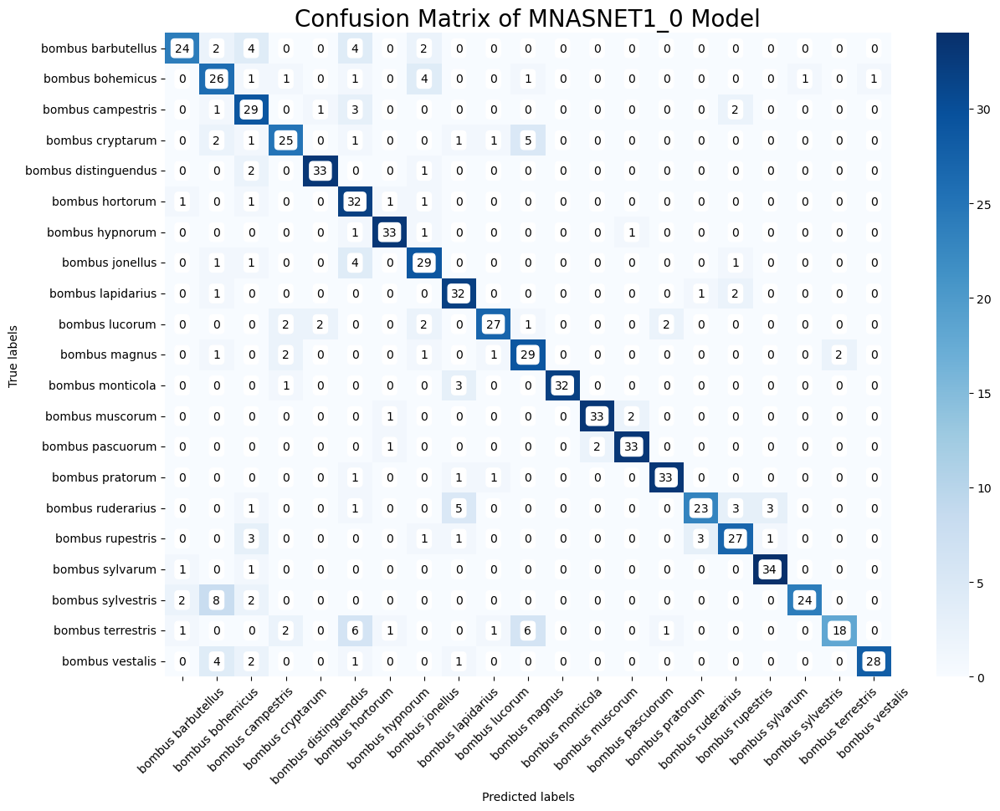

In [80]:
plot_confusion_matrix_pytorch(model_mnasnet, dataloaders_dict['validate'], 
                              idx_to_class, 'MNASNET1_0')

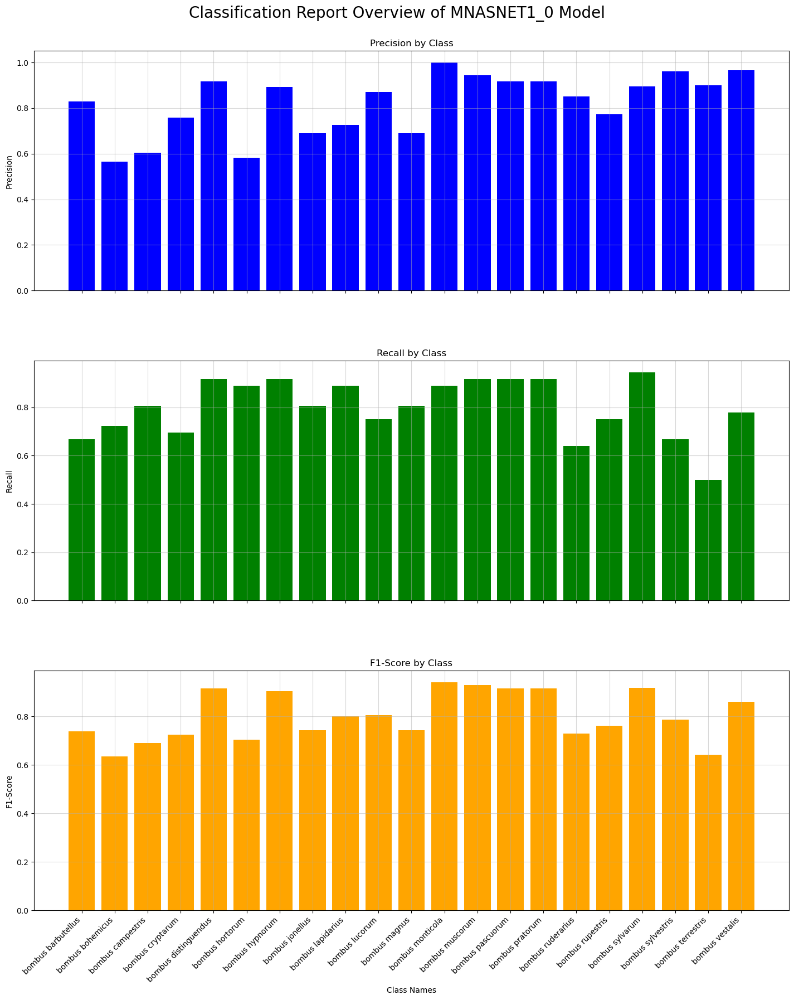

In [81]:
plot_classification_report_pytorch(model_mnasnet, dataloaders_dict['validate'], 
                                   idx_to_class, "MNASNET1_0")

In [82]:
print_classification_report_pytorch(model_mnasnet, dataloaders_dict['validate'], 
                                    idx_to_class, "MNASNET1_0")

Classification Report of MNASNET1_0 Model:
                       precision    recall  f1-score   support

  bombus barbutellus       0.83      0.67      0.74        36
    bombus bohemicus       0.57      0.72      0.63        36
   bombus campestris       0.60      0.81      0.69        36
    bombus cryptarum       0.76      0.69      0.72        36
bombus distinguendus       0.92      0.92      0.92        36
     bombus hortorum       0.58      0.89      0.70        36
     bombus hypnorum       0.89      0.92      0.90        36
     bombus jonellus       0.69      0.81      0.74        36
   bombus lapidarius       0.73      0.89      0.80        36
      bombus lucorum       0.87      0.75      0.81        36
       bombus magnus       0.69      0.81      0.74        36
    bombus monticola       1.00      0.89      0.94        36
     bombus muscorum       0.94      0.92      0.93        36
    bombus pascuorum       0.92      0.92      0.92        36
     bombus pratorum     

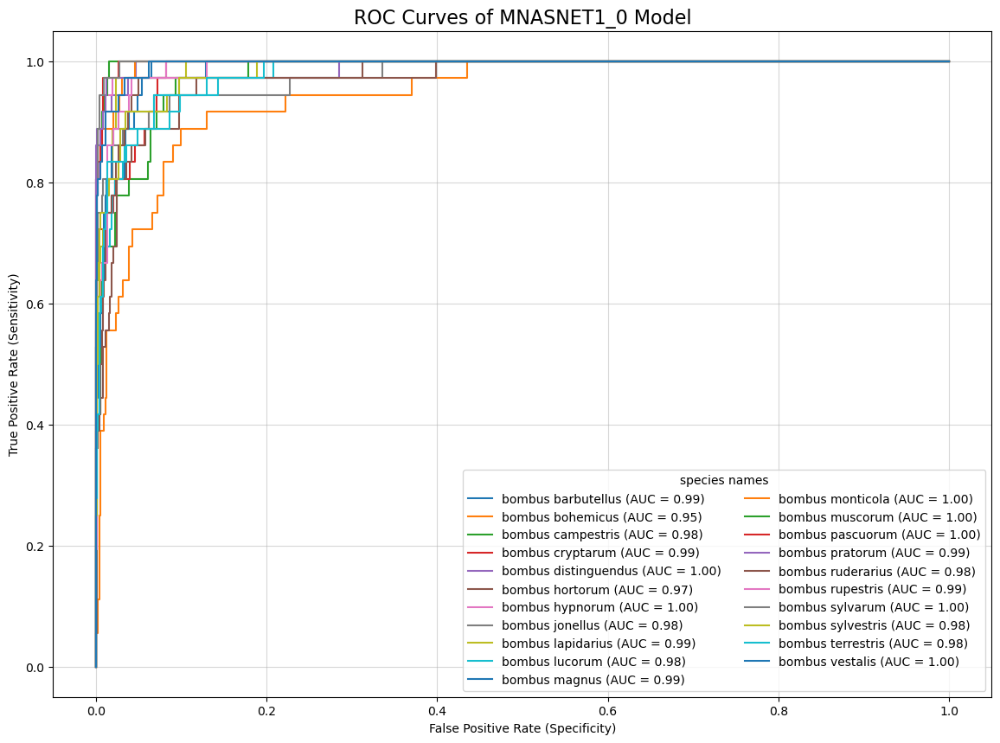

In [83]:
plot_roc_curves_pytorch(model_mnasnet, dataloaders_dict['validate'], 
                        idx_to_class, "MNASNET1_0")